# Sample

## 압축 해제

In [ ]:
import zipfile
import os

# 파일 경로
zip_file_path = '/content/drive/MyDrive/Sample.zip'

# 압축을 풀 폴더 경로
extract_folder_berry = '/'

# 폴더가 없으면 생성
if not os.path.exists(extract_folder_berry):
    os.makedirs(extract_folder_berry)

# ZIP 파일 열기 및 압축 풀기
try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_folder_berry)
    print(f"압축이 성공적으로 풀렸습니다: {extract_folder_berry}")
except zipfile.BadZipFile:
    print("ZIP 파일을 읽는 데 오류가 발생했습니다. 파일이 손상되었을 수 있습니다.")
except Exception as e:
    print(f"오류 발생: {e}")


압축이 성공적으로 풀렸습니다: /content


In [ ]:

import zipfile
import os

# 파일 경로
zip_file_path = '/content/drive/MyDrive/strawberry_smartfarm_eng.zip'

# 압축을 풀 폴더 경로
extract_folder_berry = '/'

# 폴더가 없으면 생성
if not os.path.exists(extract_folder_berry):
    os.makedirs(extract_folder_berry)

# ZIP 파일 열기 및 압축 풀기
try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_folder_berry)
    print(f"압축이 성공적으로 풀렸습니다: {extract_folder_berry}")
except zipfile.BadZipFile:
    print("ZIP 파일을 읽는 데 오류가 발생했습니다. 파일이 손상되었을 수 있습니다.")
except Exception as e:
    print(f"오류 발생: {e}")


압축이 성공적으로 풀렸습니다: /content


## 현재 데이터 트리

In [ ]:
!apt-get install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (82.5 kB/s)
Selecting previously unselected package tree.
(Reading database ... 126281 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [ ]:
!tree -L 3 /content/Sample

/content/Sample
├── 01.원천데이터
│   ├── 딸기
│   │   ├── 해충트랩
│   │   ├── 생육측정
│   │   ├── 병해충피해이미지
│   │   ├── 시계열생육(온실전체)
│   │   └── 시계열생육(작물부위)
│   └── 오이
│       ├── 해충트랩
│       ├── 생육측정
│       ├── 병해충피해이미지
│       ├── 시계열생육(온실전체)
│       └── 시계열생육(작물부위)
└── 02.라벨링데이터
    ├── 딸기
    │   ├── 해충트랩
    │   ├── 생육측정
    │   ├── 병해충피해이미지
    │   ├── 시계열생육(온실전체)
    │   └── 시계열생육(작물부위)
    └── 오이
        ├── 해충트랩
        ├── 생육측정
        ├── 병해충피해이미지
        ├── 시계열생육(온실전체)
        └── 시계열생육(작물부위)

26 directories, 0 files


## 목적에 맞지 않는 폴더 삭제(오이, 해충트랩, 큐알 포함된 이미지)

In [ ]:
rm -r /content/Sample/01.원천데이터/오이

rm: cannot remove '/content/Sample/01.원천데이터/오이': No such file or directory


In [ ]:
rm -r /content/Sample/02.라벨링데이터/오이

In [ ]:
rm -r /content/Sample/01.원천데이터/딸기/해충트랩

In [ ]:
rm -r /content/Sample/02.라벨링데이터/딸기/해충트랩

rm: cannot remove '/content/Sample/02.라벨링데이터/딸기/해충트랩': No such file or directory


In [ ]:
rm -r /content/Sample/01.원천데이터/딸기/생육측정

In [ ]:
rm -r /content/Sample/02.라벨링데이터/딸기/생육측정

## 폴더 이름과 경로 수정

폴더명 영어로 변경

In [ ]:
import os

# 기준 디렉토리
root_path = "/content/Sample"

# 폴더명 매핑 정의
rename_map = {
    "01.원천데이터": "image",
    "02.라벨링데이터": "label",
    "딸기": "strawberry",
    "생육측정": "growth_measure",
    "해충트랩": "pest_trap",
    "병해충피해이미지": "pest_disease_damage",
    "시계열생육(온실전체)": "timeseries_greenhouse",
    "시계열생육(작물부위)": "timeseries_crop_part"
}

# 1단계: 대분류(01.원천데이터 → image 등)
for old_top in ["01.원천데이터", "02.라벨링데이터"]:
    old_top_path = os.path.join(root_path, old_top)
    if os.path.exists(old_top_path):
        new_top = rename_map.get(old_top, old_top)
        new_top_path = os.path.join(root_path, new_top)
        os.rename(old_top_path, new_top_path)
        print(f"Renamed: {old_top_path} -> {new_top_path}")

        # 2단계: 딸기 → strawberry
        old_strawberry = os.path.join(new_top_path, "딸기")
        new_strawberry = os.path.join(new_top_path, "strawberry")
        if os.path.exists(old_strawberry):
            os.rename(old_strawberry, new_strawberry)
            print(f"Renamed: {old_strawberry} -> {new_strawberry}")

        # 3단계: 내부 하위 폴더명 영어로 변경
        for old_name, new_name in rename_map.items():
            inner_old = os.path.join(new_strawberry, old_name)
            inner_new = os.path.join(new_strawberry, new_name)
            if os.path.exists(inner_old):
                os.rename(inner_old, inner_new)
                print(f"Renamed: {inner_old} -> {inner_new}")


Renamed: /content/Sample/01.원천데이터 -> /content/Sample/image
Renamed: /content/Sample/image/딸기 -> /content/Sample/image/strawberry
Renamed: /content/Sample/image/strawberry/병해충피해이미지 -> /content/Sample/image/strawberry/pest_disease_damage
Renamed: /content/Sample/image/strawberry/시계열생육(온실전체) -> /content/Sample/image/strawberry/timeseries_greenhouse
Renamed: /content/Sample/image/strawberry/시계열생육(작물부위) -> /content/Sample/image/strawberry/timeseries_crop_part
Renamed: /content/Sample/02.라벨링데이터 -> /content/Sample/label
Renamed: /content/Sample/label/딸기 -> /content/Sample/label/strawberry
Renamed: /content/Sample/label/strawberry/병해충피해이미지 -> /content/Sample/label/strawberry/pest_disease_damage
Renamed: /content/Sample/label/strawberry/시계열생육(온실전체) -> /content/Sample/label/strawberry/timeseries_greenhouse
Renamed: /content/Sample/label/strawberry/시계열생육(작물부위) -> /content/Sample/label/strawberry/timeseries_crop_part


경로 수정

In [ ]:
# 루트 폴더명 변경
mv Sample Strawberry

In [ ]:
# 내부 폴더명 변경
mv /content/Strawberry/image/strawberry /content/Strawberry/image/image

In [ ]:
mv /content/Strawberry/label/strawberry /content/Strawberry/label/label

In [ ]:
# ../으로 꺼내기
mv /content/Strawberry/image/image/* /content/Strawberry/image/

In [ ]:
mv /content/Strawberry/label/image/* /content/Strawberry/label/

In [ ]:
# 꺼내고 빈 폴더 삭제
rm -rf /content/Strawberry/image/image

In [ ]:
rm -rf /content/Strawberry/label/image

## 갯수 및 트리 확인

In [ ]:
import os
from collections import defaultdict

target_folder = '/content/Strawberry/'

folder_stats = defaultdict(lambda: {'jpg': 0, 'json': 0, 'other': 0})

for root, dirs, files in os.walk(target_folder):
    for file in files:
        ext = file.lower().split('.')[-1]
        if ext == 'jpg':
            folder_stats[root]['jpg'] += 1
        elif ext == 'json':
            folder_stats[root]['json'] += 1
        else:
            folder_stats[root]['other'] += 1

for folder, stats in folder_stats.items():
    print(f"\n폴더: {folder}")
    print(f"  JPG 파일 개수: {stats['jpg']}")
    print(f"  JSON 파일 개수: {stats['json']}")
    print(f"  기타 파일 개수: {stats['other']}")


폴더: /content/Strawberry/label/timeseries_crop_part
  JPG 파일 개수: 0
  JSON 파일 개수: 270
  기타 파일 개수: 0

폴더: /content/Strawberry/label/pest_disease_damage
  JPG 파일 개수: 0
  JSON 파일 개수: 100
  기타 파일 개수: 0

폴더: /content/Strawberry/label/timeseries_greenhouse
  JPG 파일 개수: 0
  JSON 파일 개수: 400
  기타 파일 개수: 0

폴더: /content/Strawberry/image/timeseries_crop_part
  JPG 파일 개수: 270
  JSON 파일 개수: 0
  기타 파일 개수: 0

폴더: /content/Strawberry/image/pest_disease_damage
  JPG 파일 개수: 100
  JSON 파일 개수: 0
  기타 파일 개수: 0

폴더: /content/Strawberry/image/timeseries_greenhouse
  JPG 파일 개수: 400
  JSON 파일 개수: 0
  기타 파일 개수: 0


In [ ]:
!tree -L 2 /content/Strawberry/

/content/Strawberry/
├── image
│   ├── pest_disease_damage
│   ├── timeseries_crop_part
│   └── timeseries_greenhouse
└── label
    ├── pest_disease_damage
    ├── timeseries_crop_part
    └── timeseries_greenhouse

8 directories, 0 files


## 각 메타데이터 확인

### 세 폴더 레이블의 JSON 형태가 같은지 우선 확인.

In [ ]:
import os
import json

def get_structure(obj):
    """
    JSON 객체의 구조(키와 중첩 구조)를 튜플 형태로 반환
    """
    if isinstance(obj, dict):
        return tuple(sorted((k, get_structure(v)) for k, v in obj.items()))
    elif isinstance(obj, list):
        # 리스트의 첫 요소로 구조 대표 (비어있으면 None)
        return [get_structure(obj[0])] if obj else []
    else:
        return type(obj).__name__

label_folder = '/content/extracted_files_strawberry/Sample/02.label_data/strawberry'
structures = []
paths = []

for root, dirs, files in os.walk(label_folder):
    json_files = [f for f in files if f.lower().endswith('.json')]
    if json_files:
        first_json = sorted(json_files)[0]
        first_json_path = os.path.join(root, first_json)
        try:
            with open(first_json_path, 'r') as json_file:
                data = json.load(json_file)
            struct = get_structure(data)
            structures.append(struct)
            paths.append(first_json_path)
        except Exception as e:
            print(f"{first_json_path} 읽기 오류: {e}")

# 구조 비교
all_same = all(struct == structures[0] for struct in structures)
if all_same:
    print("\n모든 폴더의 첫 번째 JSON 구조가 같습니다!")
else:
    print("\nJSON 구조가 다른 폴더가 있습니다:")
    for path, struct in zip(paths, structures):
        print(f"\n{path}\n구조: {struct}")



모든 폴더의 첫 번째 JSON 구조가 같습니다!


### 각각 폴더별 1st JSON 파일 읽기.

In [ ]:
import os
import json
from pprint import pprint

# label 폴더 경로 지정
label_folder = '/content/Strawberry/label'

# 하위 폴더 순회
for root, dirs, files in os.walk(label_folder):
    # 현재 폴더 내 JSON 파일만 추출
    json_files = [f for f in files if f.lower().endswith('.json')]
    if json_files:
        # 알파벳순 첫 번째 JSON 파일 선택 (원하면 sorted 대신 min 사용 가능)
        first_json = sorted(json_files)[0]
        first_json_path = os.path.join(root, first_json)
        print(f"\n[{root}]의 첫 번째 JSON 파일: {first_json}")
        try:
            with open(first_json_path, 'r') as json_file:
                data = json.load(json_file)
            print("파일 읽기 성공!")
            pprint(data)
        except Exception as e:
            print(f"  오류: {e}")
    # else:  # JSON 파일 없는 폴더는 생략
    #     print(f"\n[{root}]에 JSON 파일이 없습니다.")



[/content/Strawberry/label/timeseries_crop_part]의 첫 번째 JSON 파일: V003_3_2_1_2_4_2_2_1_0_0_20221124_1107_20240422181608.json
파일 읽기 성공!
{'description': {'date': '20221124',
                 'height': 4032,
                 'image': 'V003_3_2_1_2_4_2_2_1_0_0_20221124_1107_20240422181608.jpg',
                 'time': '91011',
                 'width': 3024},
 'metadata': [{'name': '데이터종류코드', 'no': 1, 'value': ''},
              {'name': '작물코드', 'no': 2, 'value': '딸기_설향'},
              {'name': '개체코드', 'no': 3, 'value': '구분없음'},
              {'name': '작물부위코드', 'no': 4, 'value': '열매'},
              {'name': '생육단계코드', 'no': 5, 'value': '착화/과실기'},
              {'name': '작물상태코드', 'no': 6, 'value': '정상'},
              {'name': '피해정도코드', 'no': 7, 'value': '정상'},
              {'name': '생육지표코드', 'no': 8, 'value': '구분없음'},
              {'name': '', 'no': 9, 'value': ''},
              {'name': '', 'no': 10, 'value': ''}],
 'result': [{'cx': None,
             'cy': None,
             'h': 14

### JSON 내부 통계

In [16]:
ls /content/Strawberry/label

ls: cannot access '/content/Strawberry/label': No such file or directory


In [17]:
import os
import json
from collections import Counter, defaultdict
from tqdm import tqdm

# label 폴더 경로
label_folder = '/content/content/Strawberry/label'

# 통계 저장용
folder_stats = {}

# 하위 폴더 순회
for root, dirs, files in os.walk(label_folder):
    json_files = [f for f in files if f.lower().endswith('.json')]
    if not json_files:
        continue

    folder_name = os.path.relpath(root, label_folder)
    folder_stats[folder_name] = {
        'date': Counter(),
        'time': Counter(),
        'image_size': Counter(),
        'metadata': defaultdict(Counter),
        'result_type': Counter(),
        'result_attrb': Counter(),
        'result_bbox_size': [],
        'result_count': []
    }

    for jf in tqdm(json_files, desc=f'[{folder_name}]'):
        try:
            with open(os.path.join(root, jf), 'r') as f:
                data = json.load(f)
            # with open(first_json_path, 'r', encoding='utf-8-sig') as json_file:
                # data = json.load(json_file)

        except Exception as e:
            print(f'  오류: {jf} - {e}')
            continue

        # 날짜, 시간, 이미지 크기
        desc = data.get('description', {})
        folder_stats[folder_name]['date'][desc.get('date')] += 1
        folder_stats[folder_name]['time'][desc.get('time')] += 1
        size = (desc.get('width'), desc.get('height'))
        folder_stats[folder_name]['image_size'][size] += 1

        # 메타데이터 분포
        for meta in data.get('metadata', []):
            name = meta.get('name', '')
            value = meta.get('value', '')
            if name:
                folder_stats[folder_name]['metadata'][name][value] += 1

        # result 분포
        results = data.get('result', [])
        folder_stats[folder_name]['result_count'].append(len(results))
        for res in results:
            folder_stats[folder_name]['result_type'][res.get('type', '')] += 1
            # attrb(있을 때만, 예: timeseries_greenhouse)
            if 'attrb' in res:
                folder_stats[folder_name]['result_attrb'][res['attrb']] += 1
            # bbox size
            w, h = res.get('w'), res.get('h')
            if w and h:
                folder_stats[folder_name]['result_bbox_size'].append((w, h))

# 통계 결과 출력
for folder, stats in folder_stats.items():
    print(f"\n=== 폴더: {folder} ===")
    print(f"- 날짜 분포: {stats['date'].most_common(5)}")
    print(f"- 시간 분포: {stats['time'].most_common(5)}")
    print(f"- 이미지 크기 분포: {stats['image_size'].most_common(5)}")
    print(f"- 결과 개수(평균): {sum(stats['result_count'])/len(stats['result_count']):.2f}")
    print(f"- result type 분포: {stats['result_type'].most_common()}")
    if stats['result_attrb']:
        print(f"- result attrb 분포: {stats['result_attrb'].most_common()}")
    # 메타데이터 분포
    print("- 메타데이터 분포:")
    for meta_name, val_counter in stats['metadata'].items():
        print(f"    {meta_name}: {val_counter.most_common(3)}")
    # bbox size 예시
    if stats['result_bbox_size']:
        ws, hs = zip(*stats['result_bbox_size'])
        print(f"- bbox width 평균: {sum(ws)/len(ws):.1f}, height 평균: {sum(hs)/len(hs):.1f}")


# Whole Original dataset

## Json

### 압축 해제

In [1]:
import zipfile
import os

# 파일 경로
zip_file_path = '/Users/temp/Downloads/strawberry/labels_each_folder_1100.zip'

# 압축을 풀 폴더 경로
extract_folder_berry = '/Users/temp/Downloads/strawberry/'

# 폴더가 없으면 생성
if not os.path.exists(extract_folder_berry):
    os.makedirs(extract_folder_berry)

# ZIP 파일 열기 및 압축 풀기
try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_folder_berry)
    print(f"압축이 성공적으로 풀렸습니다: {extract_folder_berry}")
except zipfile.BadZipFile:
    print("ZIP 파일을 읽는 데 오류가 발생했습니다. 파일이 손상되었을 수 있습니다.")
except Exception as e:
    print(f"오류 발생: {e}")


압축이 성공적으로 풀렸습니다: /Users/temp/Downloads/strawberry/


### 전체 클래스 분포 체크

In [5]:
import os
import json
from collections import Counter, defaultdict
from tqdm import tqdm

# label 폴더 경로
label_folder = '/content/content/or'

# 통계 저장용
folder_stats = {}

# 하위 폴더 순회
for root, dirs, files in os.walk(label_folder):
    json_files = [f for f in files if f.lower().endswith('.json')]
    if not json_files:
        continue

    folder_name = os.path.relpath(root, label_folder)
    folder_stats[folder_name] = {
        'date': Counter(),
        'time': Counter(),
        'image_size': Counter(),
        'metadata': defaultdict(Counter),
        'result_type': Counter(),
        'result_attrb': Counter(),
        'result_bbox_size': [],
        'result_count': []
    }

    for jf in tqdm(json_files, desc=f'[{folder_name}]'):
        try:
            with open(os.path.join(root, jf), 'r') as f:
                data = json.load(f)

        except Exception as e:
            print(f'  오류: {jf} - {e}')
            continue

        # 날짜, 시간, 이미지 크기
        desc = data.get('description', {})
        folder_stats[folder_name]['date'][desc.get('date')] += 1
        folder_stats[folder_name]['time'][desc.get('time')] += 1
        size = (desc.get('width'), desc.get('height'))
        folder_stats[folder_name]['image_size'][size] += 1

        # 메타데이터 분포
        for meta in data.get('metadata', []):
            name = meta.get('name', '')
            value = meta.get('value', '')
            if name:
                folder_stats[folder_name]['metadata'][name][value] += 1

        # result 분포
        results = data.get('result', [])
        folder_stats[folder_name]['result_count'].append(len(results))
        for res in results:
            folder_stats[folder_name]['result_type'][res.get('type', '')] += 1
            # attrb(있을 때만, 예: timeseries_greenhouse)
            if 'attrb' in res:
                folder_stats[folder_name]['result_attrb'][res['attrb']] += 1
            # bbox size
            w, h = res.get('w'), res.get('h')
            if w and h:
                folder_stats[folder_name]['result_bbox_size'].append((w, h))

# 통계 결과 출력
for folder, stats in folder_stats.items():
    print(f"\n=== 폴더: {folder} ===")
    print(f"- 날짜 분포: {stats['date'].most_common(5)}")
    print(f"- 시간 분포: {stats['time'].most_common(5)}")
    print(f"- 이미지 크기 분포: {stats['image_size'].most_common(5)}")
    print(f"- 결과 개수(평균): {sum(stats['result_count'])/len(stats['result_count']):.2f}")
    print(f"- result type 분포: {stats['result_type'].most_common()}")
    if stats['result_attrb']:
        print(f"- result attrb 분포: {stats['result_attrb'].most_common()}")
    # 메타데이터 분포
    print("- 메타데이터 분포:")
    for meta_name, val_counter in stats['metadata'].items():
        print(f"    {meta_name}: {val_counter.most_common(3)}")
    # bbox size 예시
    if stats['result_bbox_size']:
        ws, hs = zip(*stats['result_bbox_size'])
        print(f"- bbox width 평균: {sum(ws)/len(ws):.1f}, height 평균: {sum(hs)/len(hs):.1f}")


[or_disease]: 100%|██████████| 1106/1106 [00:00<00:00, 12569.60it/s]



=== 폴더: or_time_house ===
- 날짜 분포: [('20221101', 11248), ('20221103', 8155), ('20221102', 6023), ('20221031', 1328), ('20221105', 1264)]
- 시간 분포: [('910:26', 16292), ('912:10', 12118), ('912:20', 1042), ('0000', 93), ('909:30', 1)]
- 이미지 크기 분포: [((800, 600), 29491), ((800, 580), 4), ((800, 596), 4), ((1066, 600), 4), ((800, 576), 4)]
- 결과 개수(평균): 1.37
- result type 분포: [('bbox', 40432), ('사각형', 95)]
- result attrb 분포: [('꽃', 40527)]
- 메타데이터 분포:
    데이터종류코드: [('시계열생육(자동)', 29546)]
    작물종류코드: [('딸기_설향', 29546)]
    개체코드: [('구분없음', 29546)]
    작물부위코드: [('구분없음', 29546)]
    생육단계코드: [('생장기', 29546)]
    작물상태코드: [('구분없음', 29546)]
    피해정도코드: [('구분없음', 29546)]
    생육지표코드: [('구분없음', 29546)]
- bbox width 평균: 31.1, height 평균: 33.9

=== 폴더: or_time_crop ===
- 날짜 분포: [('20221028', 291), ('20221105', 123), ('20221026', 89), ('20221027', 60), ('20221031', 11)]
- 시간 분포: [('91011', 405), ('91211', 177), ('0000', 4)]
- 이미지 크기 분포: [((1848, 4000), 167), ((3024, 4032), 138), ((2252, 4000), 103), ((4032,

🕐 타임시리즈 데이터 시간 매칭 분석

📁 'timeseries_crop_part' 폴더 분석 중...
   ✅ 성공적으로 파싱된 파일: 21468
   ❌ 실패한 파일: 192
   📄 파일명 패턴 분석: {14: 21660}
   실패한 파일 예시:
     - V003_3_2_1_4_3_2_2_1_0_0_221018_5660_20240422182315.json: 시간 파싱 실패: V003_3_2_1_4_3_2_2_1_0_0_221018_5660_20240422182315.jpg
     - V003_3_2_1_4_3_2_2_1_0_0_221018_5661_20240422182316.json: 시간 파싱 실패: V003_3_2_1_4_3_2_2_1_0_0_221018_5661_20240422182316.jpg
     - V003_3_2_1_4_3_2_2_1_0_0_221018_5662_20240422182316.json: 시간 파싱 실패: V003_3_2_1_4_3_2_2_1_0_0_221018_5662_20240422182316.jpg

📁 'timeseries_greenhouse' 폴더 분석 중...
   ✅ 성공적으로 파싱된 파일: 38727
   ❌ 실패한 파일: 0
   📄 파일명 패턴 분석: {14: 38727}

📊 시간 범위 분석:
   Crop Part - 시작: 2022-01-01 01:00:01, 끝: 2211-10-12 05:00:00
   Crop Part - 총 21468개 시점
   Greenhouse - 시작: 2022-10-02 06:01:00, 끝: 2022-12-31 00:00:00
   Greenhouse - 총 38727개 시점

📅 YEAR별 분석:
   공통 year: 1개
   Crop에만 있는 year: 2개
   Greenhouse에만 있는 year: 0개
   공통 year들:
     - 2022: Crop(14604), Greenhouse(38727)
   Crop에만 있는 year 예시:
     - 

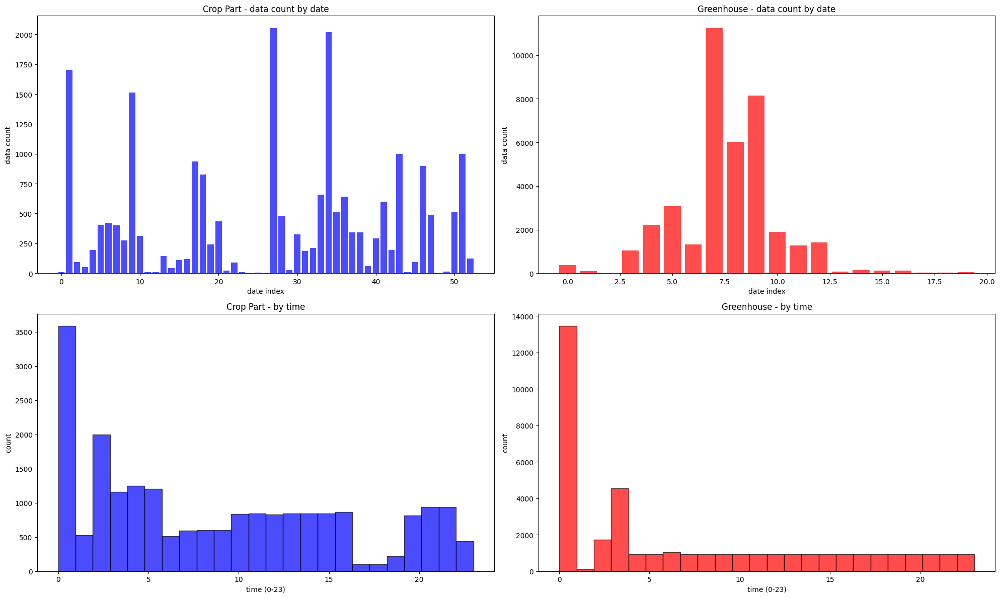


🔍 'crop_part' 실패 파일 패턴 분석:
   예시: V003_3_2_1_4_3_2_2_1_0_0_221018_5660_20240422182315.jpg
     - 파트 수: 14
     - 마지막 3개 파트: ['221018', '5660', '20240422182315.jpg']
   예시: V003_3_2_1_4_3_2_2_1_0_0_221018_5661_20240422182316.jpg
     - 파트 수: 14
     - 마지막 3개 파트: ['221018', '5661', '20240422182316.jpg']
   예시: V003_3_2_1_4_3_2_2_1_0_0_221018_5662_20240422182316.jpg
     - 파트 수: 14
     - 마지막 3개 파트: ['221018', '5662', '20240422182316.jpg']
   패턴 요약: {'parts_count_14': 192}


In [ ]:
import os
import json
from datetime import datetime
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import pandas as pd

def extract_datetime_from_filename(filename):
    """
    파일명에서 datetime 정보를 추출하는 함수
    다양한 형식을 시도해봄
    """
    # 언더스코어로 분리
    parts = filename.split('_')

    # 형식 1: 일반적인 형식 (끝에서 3번째와 2번째)
    if len(parts) >= 3:
        date_str = parts[-3]
        time_str = parts[-2]

        # 여러 형식 시도
        datetime_formats = [
            ("%Y%m%d%H%M%S", date_str + time_str),  # 전체 time_str 사용
            ("%Y%m%d%H%M", date_str + time_str[:4]),  # 4자리만 사용
            ("%Y%m%d%H%M", date_str + time_str[:4] if len(time_str) >= 4 else time_str),
        ]

        for fmt, dt_str in datetime_formats:
            try:
                return datetime.strptime(dt_str, fmt)
            except:
                continue

    # 형식 2: 긴 형식의 파일명 (V003_2_2_1_1_3_1_1_1_0_0_20221116_42960_20240422193551.jpg)
    # 날짜 패턴 찾기
    for part in parts:
        if len(part) == 8 and part.isdigit():
            # YYYYMMDD 형식
            try:
                date_only = datetime.strptime(part, "%Y%m%d")
                return date_only
            except:
                continue

    return None

def analyze_timeseries_folder(folder_path, folder_name):
    """
    단일 타임시리즈 폴더를 분석하는 함수
    """
    print(f"\n📁 '{folder_name}' 폴더 분석 중...")

    time_data = {}
    failed_files = []
    date_patterns = Counter()

    # JSON 파일들 처리
    json_files = [f for f in os.listdir(folder_path) if f.endswith('.json')]

    for file in sorted(json_files):
        file_path = os.path.join(folder_path, file)
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                data = json.load(f)

            # 이미지 파일명 추출
            img_name = data.get("description", {}).get("image", "")
            if not img_name:
                failed_files.append((file, "이미지 파일명 없음"))
                continue

            # 파일명 패턴 분석
            parts = img_name.split('_')
            date_patterns[len(parts)] += 1

            # 시간 정보 추출
            dt = extract_datetime_from_filename(img_name)
            if dt:
                time_data[file] = {
                    'datetime': dt,
                    'image_name': img_name,
                    'json_file': file
                }
            else:
                failed_files.append((file, f"시간 파싱 실패: {img_name}"))

        except Exception as e:
            failed_files.append((file, f"JSON 읽기 오류: {str(e)}"))

    print(f"   ✅ 성공적으로 파싱된 파일: {len(time_data)}")
    print(f"   ❌ 실패한 파일: {len(failed_files)}")
    print(f"   📄 파일명 패턴 분석: {dict(date_patterns)}")

    if failed_files:
        print("   실패한 파일 예시:")
        for file, reason in failed_files[:3]:
            print(f"     - {file}: {reason}")

    return time_data, failed_files

def analyze_by_period(time_data, period_type='day'):
    """
    시간 데이터를 기간별로 분석하는 함수
    period_type: 'year', 'month', 'day', 'hour'
    """
    if not time_data:
        return {}

    period_data = defaultdict(list)

    for file_info in time_data.values():
        dt = file_info['datetime']

        if period_type == 'year':
            key = dt.year
        elif period_type == 'month':
            key = f"{dt.year}-{dt.month:02d}"
        elif period_type == 'day':
            key = f"{dt.year}-{dt.month:02d}-{dt.day:02d}"
        elif period_type == 'hour':
            key = f"{dt.year}-{dt.month:02d}-{dt.day:02d} {dt.hour:02d}:00"

        period_data[key].append(file_info)

    return dict(period_data)

def compare_timeseries_folders(crop_path, greenhouse_path):
    """
    두 타임시리즈 폴더의 시간 정보를 비교하는 함수
    """
    print("=" * 60)
    print("🕐 타임시리즈 데이터 시간 매칭 분석")
    print("=" * 60)

    # 각 폴더 분석
    crop_data, crop_failed = analyze_timeseries_folder(crop_path, "timeseries_crop_part")
    greenhouse_data, greenhouse_failed = analyze_timeseries_folder(greenhouse_path, "timeseries_greenhouse")

    # 시간 범위 분석
    print("\n📊 시간 범위 분석:")

    if crop_data:
        crop_times = [data['datetime'] for data in crop_data.values()]
        crop_min, crop_max = min(crop_times), max(crop_times)
        print(f"   Crop Part - 시작: {crop_min}, 끝: {crop_max}")
        print(f"   Crop Part - 총 {len(crop_times)}개 시점")

    if greenhouse_data:
        greenhouse_times = [data['datetime'] for data in greenhouse_data.values()]
        greenhouse_min, greenhouse_max = min(greenhouse_times), max(greenhouse_times)
        print(f"   Greenhouse - 시작: {greenhouse_min}, 끝: {greenhouse_max}")
        print(f"   Greenhouse - 총 {len(greenhouse_times)}개 시점")

    # 기간별 분석
    periods = ['year', 'month', 'day']

    for period in periods:
        print(f"\n📅 {period.upper()}별 분석:")

        crop_periods = analyze_by_period(crop_data, period)
        greenhouse_periods = analyze_by_period(greenhouse_data, period)

        crop_period_keys = set(crop_periods.keys())
        greenhouse_period_keys = set(greenhouse_periods.keys())

        common_periods = crop_period_keys & greenhouse_period_keys
        only_crop_periods = crop_period_keys - greenhouse_period_keys
        only_greenhouse_periods = greenhouse_period_keys - crop_period_keys

        print(f"   공통 {period}: {len(common_periods)}개")
        print(f"   Crop에만 있는 {period}: {len(only_crop_periods)}개")
        print(f"   Greenhouse에만 있는 {period}: {len(only_greenhouse_periods)}개")

        if common_periods:
            print(f"   공통 {period}들:")
            for common_period in sorted(common_periods):
                crop_count = len(crop_periods[common_period])
                greenhouse_count = len(greenhouse_periods[common_period])
                print(f"     - {common_period}: Crop({crop_count}), Greenhouse({greenhouse_count})")

        if only_crop_periods:
            print(f"   Crop에만 있는 {period} 예시:")
            for period_key in sorted(only_crop_periods)[:5]:
                count = len(crop_periods[period_key])
                print(f"     - {period_key} ({count}개)")

        if only_greenhouse_periods:
            print(f"   Greenhouse에만 있는 {period} 예시:")
            for period_key in sorted(only_greenhouse_periods)[:5]:
                count = len(greenhouse_periods[period_key])
                print(f"     - {period_key} ({count}개)")

    # 시각화
    if crop_data and greenhouse_data:
        create_period_comparison_plot(crop_data, greenhouse_data)

    return {
        'crop_data': crop_data,
        'greenhouse_data': greenhouse_data,
        'crop_failed': crop_failed,
        'greenhouse_failed': greenhouse_failed
    }

def create_period_comparison_plot(crop_data, greenhouse_data):
    """
    기간별 데이터 분포를 시각화하는 함수
    """
    fig, axes = plt.subplots(2, 2, figsize=(20, 12))

    # 일별 분포
    crop_daily = analyze_by_period(crop_data, 'day')
    greenhouse_daily = analyze_by_period(greenhouse_data, 'day')

    # Crop 일별 분포
    crop_dates = list(crop_daily.keys())
    crop_counts = [len(crop_daily[date]) for date in crop_dates]

    axes[0, 0].bar(range(len(crop_dates)), crop_counts, alpha=0.7, color='blue')
    axes[0, 0].set_title('Crop Part - data count by date')
    axes[0, 0].set_xlabel('date index')
    axes[0, 0].set_ylabel('data count')

    # Greenhouse 일별 분포
    greenhouse_dates = list(greenhouse_daily.keys())
    greenhouse_counts = [len(greenhouse_daily[date]) for date in greenhouse_dates]

    axes[0, 1].bar(range(len(greenhouse_dates)), greenhouse_counts, alpha=0.7, color='red')
    axes[0, 1].set_title('Greenhouse - data count by date')
    axes[0, 1].set_xlabel('date index')
    axes[0, 1].set_ylabel('data count')

    # 시간별 분포 (시간만)
    crop_times = [data['datetime'] for data in crop_data.values()]
    greenhouse_times = [data['datetime'] for data in greenhouse_data.values()]

    crop_hours = [dt.hour for dt in crop_times]
    greenhouse_hours = [dt.hour for dt in greenhouse_times]

    axes[1, 0].hist(crop_hours, bins=24, alpha=0.7, color='blue', edgecolor='black')
    axes[1, 0].set_title('Crop Part - by time')
    axes[1, 0].set_xlabel('time (0-23)')
    axes[1, 0].set_ylabel('count')

    axes[1, 1].hist(greenhouse_hours, bins=24, alpha=0.7, color='red', edgecolor='black')
    axes[1, 1].set_title('Greenhouse - by time')
    axes[1, 1].set_xlabel('time (0-23)')
    axes[1, 1].set_ylabel('count')

    plt.tight_layout()
    plt.show()

def analyze_failed_files(failed_files, folder_name):
    """
    실패한 파일들의 패턴을 분석하는 함수
    """
    print(f"\n🔍 '{folder_name}' 실패 파일 패턴 분석:")

    patterns = defaultdict(int)

    for file, reason in failed_files:
        if "시간 파싱 실패" in reason:
            # 파일명에서 패턴 추출
            img_name = reason.split(": ")[-1]
            parts = img_name.split('_')
            pattern = f"parts_count_{len(parts)}"
            patterns[pattern] += 1

            # 처음 몇 개만 상세 분석
            if patterns[pattern] <= 3:
                print(f"   예시: {img_name}")
                print(f"     - 파트 수: {len(parts)}")
                print(f"     - 마지막 3개 파트: {parts[-3:]}")

    print(f"   패턴 요약: {dict(patterns)}")

# 실행
if __name__ == "__main__":
    # 경로 설정
    label_crop_path = "/content/content/or/or_time_crop"
    label_greenhouse_path = "/content/content/or/or_time_house"

    # 라벨 데이터 시간 매칭 분석
    results = compare_timeseries_folders(label_crop_path, label_greenhouse_path)

    # 실패한 파일 패턴 분석
    if results['greenhouse_failed']:
        analyze_failed_files(results['greenhouse_failed'], "greenhouse")

    if results['crop_failed']:
        analyze_failed_files(results['crop_failed'], "crop_part")

### 공통 일자 외 모두 제거

In [ ]:
import os

# 이미 분석한 결과로부터 공통 날짜 리스트를 확보했다고 가정
common_days = {
    '2022-10-26', '2022-10-27', '2022-10-28', '2022-10-31',
    '2022-11-01', '2022-11-02', '2022-11-03', '2022-11-05'
}

# 날짜 추출 함수 (기존 코드 활용)
def extract_day_from_filename(filename):
    # 파일명에서 날짜 추출 (YYYYMMDD)
    parts = filename.split('_')
    for part in parts:
        if len(part) == 8 and part.isdigit():
            return f"{part[:4]}-{part[4:6]}-{part[6:8]}"
    return None

def delete_non_common_files(folder_path, common_days):
    json_files = [f for f in os.listdir(folder_path) if f.endswith('.json')]
    deleted, kept = 0, 0
    for file in json_files:
        day = extract_day_from_filename(file)
        if day not in common_days:
            os.remove(os.path.join(folder_path, file))
            deleted += 1
        else:
            kept += 1
    print(f"[{os.path.basename(folder_path)}] 삭제: {deleted}개, 유지: {kept}개")

# 사용 예시
crop_folder = "/content/content/or/or_time_crop"
greenhouse_folder = "/content/content/or/or_time_house"
disease_folder = "/content/content/or/or_disease"

delete_non_common_files(crop_folder, common_days)
delete_non_common_files(greenhouse_folder, common_days)
delete_non_common_files(disease_folder, common_days)

### 각각 일별 폴더 따로 생성해서 분류(JSON)

In [ ]:
import os
import shutil
import json
from pathlib import Path

# 기준 경로
base_path = '/content/content/or'
folders = ['or_time_crop', 'or_time_house', 'or_disease']

# 1. 라벨 파일 날짜별로 분류
for folder in folders:
    label_dir = os.path.join(base_path, folder)
    for file in os.listdir(label_dir):
        if file.endswith('.json'):
            json_path = os.path.join(label_dir, file)
            with open(json_path, 'r', encoding='utf-8') as f:
                data = json.load(f)
            date = data['description']['date']
            date_folder = os.path.join(label_dir, date)
            Path(date_folder).mkdir(parents=True, exist_ok=True)
            shutil.move(json_path, os.path.join(date_folder, file))

### 각 일자별 파일 수 체크

In [36]:
import os
from collections import defaultdict

target_folder = '/Users/temp/Downloads/strawberry/dataset/label'

folder_stats = defaultdict(lambda: {'jpg': 0, 'json': 0, 'other': 0})

for root, dirs, files in os.walk(target_folder):
    for file in files:
        ext = file.lower().split('.')[-1]
        if ext == 'jpg':
            folder_stats[root]['jpg'] += 1
        elif ext == 'json':
            folder_stats[root]['json'] += 1
        else:
            folder_stats[root]['other'] += 1

for folder, stats in folder_stats.items():
    print(f"\n폴더: {folder}")
    print(f"  JPG 파일 개수: {stats['jpg']}")
    print(f"  JSON 파일 개수: {stats['json']}")
    print(f"  기타 파일 개수: {stats['other']}")


폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221103
  JPG 파일 개수: 0
  JSON 파일 개수: 7
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221105
  JPG 파일 개수: 0
  JSON 파일 개수: 123
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221102
  JPG 파일 개수: 0
  JSON 파일 개수: 3
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221031
  JPG 파일 개수: 0
  JSON 파일 개수: 11
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221101
  JPG 파일 개수: 0
  JSON 파일 개수: 2
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221027
  JPG 파일 개수: 0
  JSON 파일 개수: 60
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221026
  JPG 파일 개수: 0
  JSON 파일 개수: 89
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/time_crop/20221028
  JPG 파일 개수: 0
  JSON 파일 개수: 291
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/dataset/label/disease/20221

### 각 일자별 데이터 수 1100 초과하면 비박스 정보 고려해서 제거

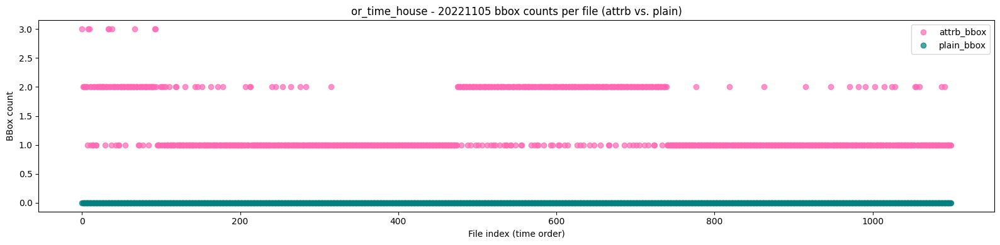

In [73]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt

def collect_attrb_bbox_per_file(day_folder):
    """
    For each JSON file in the date folder, count bboxes with and without 'attrb'.
    Returns a DataFrame: each row = one file, columns = attrb_bbox and plain_bbox counts.
    """
    records = []
    for fname in sorted(os.listdir(day_folder)):
        if fname.endswith('.json'):
            with open(os.path.join(day_folder, fname), 'r', encoding='utf-8') as f:
                data = json.load(f)
            attrb_bbox = 0
            plain_bbox = 0
            for obj in data.get('result', []):
                if obj.get('type') == 'bbox':
                    if 'attrb' in obj and obj['attrb']:
                        attrb_bbox += 1
                    else:
                        plain_bbox += 1
            records.append({'file': fname, 'attrb_bbox': attrb_bbox, 'plain_bbox': plain_bbox})
    df = pd.DataFrame(records)
    df = df.fillna(0).sort_values('file').reset_index(drop=True)
    return df

def plot_attrb_bbox(df, day, folder_name, start_idx=None, end_idx=None):
    """
    Plot attrb_bbox and plain_bbox counts per file index (scatter plot).
    """
    if start_idx is not None or end_idx is not None:
        df = df.iloc[start_idx:end_idx+1] if end_idx is not None else df.iloc[start_idx:]
    plt.figure(figsize=(16, 4))
    plt.plot(range(len(df)), df['attrb_bbox'], marker='o', linestyle='None', alpha=0.7, color='hotpink', label='attrb_bbox')
    plt.plot(range(len(df)), df['plain_bbox'], marker='o', linestyle='None', alpha=0.7, color='teal', label='plain_bbox')
    plt.title(f"{folder_name} - {day} bbox counts per file (attrb vs. plain)")
    plt.xlabel('File index (time order)')
    plt.ylabel('BBox count')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage
base_or_path = '/content/content/or'
folder_name = 'or_time_house'  # or 'or_time_crop', 'or_disease'
target_day = '20221105'
day_folder = os.path.join(base_or_path, folder_name, target_day)

df = collect_attrb_bbox_per_file(day_folder)
plot_attrb_bbox(df, target_day, folder_name, start_idx=0, end_idx=1100)


In [71]:
import os

# Parameters
base_or_path = '/content/content/or'
folder_name = 'or_time_house'   # or 'or_time_crop', 'or_disease'
target_day = '20221105'
start_idx = 0
end_idx = 1099

# Path to the target day folder
day_folder = os.path.join(base_or_path, folder_name, target_day)

# List and sort all JSON files
json_files = sorted([f for f in os.listdir(day_folder) if f.endswith('.json')])

print(f"Before deletion, JSON file count: {len(json_files)}")

# Determine files to keep
files_to_keep = set(json_files[start_idx:end_idx+1])

# Delete files outside the range
deleted_count = 0
for idx, fname in enumerate(json_files):
    if fname not in files_to_keep:
        os.remove(os.path.join(day_folder, fname))
        deleted_count += 1

# List files after deletion
remaining_files = [f for f in os.listdir(day_folder) if f.endswith('.json')]
print(f"Deleted {deleted_count} JSON files.")
print(f"After deletion, JSON file count: {len(remaining_files)}")


Before deletion, JSON file count: 1264
Deleted 164 JSON files.
After deletion, JSON file count: 1100


In [72]:
import os
import json
from collections import defaultdict

def check_json_date_match(json_path, folder_name):
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)
        json_date = data['description']['date']
        return json_date == folder_name, json_date
    except Exception as e:
        return False, None

target_folder = '/content/content/or'
folder_stats = defaultdict(lambda: {'jpg': 0, 'json': 0, 'other': 0, 'json_date_match': 0, 'json_date_mismatch': 0, 'json_dates': set()})

for root, dirs, files in os.walk(target_folder):
    folder_name = os.path.basename(root)
    for file in files:
        ext = file.lower().split('.')[-1]
        file_path = os.path.join(root, file)
        if ext == 'jpg':
            folder_stats[root]['jpg'] += 1
        elif ext == 'json':
            folder_stats[root]['json'] += 1
            # 폴더명이 8자리(날짜)인 경우만 체크
            if len(folder_name) == 8 and folder_name.isdigit():
                match, json_date = check_json_date_match(file_path, folder_name)
                if match:
                    folder_stats[root]['json_date_match'] += 1
                else:
                    folder_stats[root]['json_date_mismatch'] += 1
                if json_date:
                    folder_stats[root]['json_dates'].add(json_date)
        else:
            folder_stats[root]['other'] += 1

for folder, stats in folder_stats.items():
    print(f"\n폴더: {folder}")
    print(f"  JPG 파일 개수: {stats['jpg']}")
    print(f"  JSON 파일 개수: {stats['json']}")
    print(f"  기타 파일 개수: {stats['other']}")
    if len(os.path.basename(folder)) == 8 and os.path.basename(folder).isdigit():
        print(f"  JSON 날짜 일치: {stats['json_date_match']}개")
        print(f"  JSON 날짜 불일치: {stats['json_date_mismatch']}개")
        print(f"  폴더 내 JSON 날짜 목록: {sorted(list(stats['json_dates']))}")




폴더: /content/content/or/or_time_house/20221101
  JPG 파일 개수: 0
  JSON 파일 개수: 1100
  기타 파일 개수: 0
  JSON 날짜 일치: 1100개
  JSON 날짜 불일치: 0개
  폴더 내 JSON 날짜 목록: ['20221101']

폴더: /content/content/or/or_time_house/20221031
  JPG 파일 개수: 0
  JSON 파일 개수: 1100
  기타 파일 개수: 0
  JSON 날짜 일치: 1100개
  JSON 날짜 불일치: 0개
  폴더 내 JSON 날짜 목록: ['20221031']

폴더: /content/content/or/or_time_house/20221027
  JPG 파일 개수: 0
  JSON 파일 개수: 8
  기타 파일 개수: 0
  JSON 날짜 일치: 8개
  JSON 날짜 불일치: 0개
  폴더 내 JSON 날짜 목록: ['20221027']

폴더: /content/content/or/or_time_house/20221105
  JPG 파일 개수: 0
  JSON 파일 개수: 1100
  기타 파일 개수: 0
  JSON 날짜 일치: 1100개
  JSON 날짜 불일치: 0개
  폴더 내 JSON 날짜 목록: ['20221105']

폴더: /content/content/or/or_time_house/20221103
  JPG 파일 개수: 0
  JSON 파일 개수: 1100
  기타 파일 개수: 0
  JSON 날짜 일치: 1100개
  JSON 날짜 불일치: 0개
  폴더 내 JSON 날짜 목록: ['20221103']

폴더: /content/content/or/or_time_house/20221102
  JPG 파일 개수: 0
  JSON 파일 개수: 1100
  기타 파일 개수: 0
  JSON 날짜 일치: 1100개
  JSON 날짜 불일치: 0개
  폴더 내 JSON 날짜 목록: ['20221102']

폴더: /cont

### 메타데이터 형태 체크

In [49]:
import os
import json
from pprint import pprint

# label 폴더 경로 지정
label_folder = '/content/content/or'

# 하위 폴더 순회
for root, dirs, files in os.walk(label_folder):
    # 현재 폴더 내 JSON 파일만 추출
    json_files = [f for f in files if f.lower().endswith('.json')]
    if json_files:
        # 알파벳순 첫 번째 JSON 파일 선택 (원하면 sorted 대신 min 사용 가능)
        first_json = sorted(json_files)[0]
        first_json_path = os.path.join(root, first_json)
        print(f"\n[{root}]의 첫 번째 JSON 파일: {first_json}")
        try:
            with open(first_json_path, 'r') as json_file:
                data = json.load(json_file)
            print("파일 읽기 성공!")
            pprint(data)
        except Exception as e:
            print(f"  오류: {e}")
    # else:  # JSON 파일 없는 폴더는 생략
    #     print(f"\n[{root}]에 JSON 파일이 없습니다.")



[/content/content/or/or_time_house]의 첫 번째 JSON 파일: V003_2_2_1_1_3_1_1_1_0_0_20221026_100_20240422184205.json
파일 읽기 성공!
{'description': {'date': '20221026',
                 'height': 600,
                 'image': 'V003_2_2_1_1_3_1_1_1_0_0_20221026_100_20240422184205.jpg',
                 'time': '910:26',
                 'width': 800},
 'metadata': [{'name': '데이터종류코드', 'no': 1, 'value': '시계열생육(자동)'},
              {'name': '작물종류코드', 'no': 2, 'value': '딸기_설향'},
              {'name': '개체코드', 'no': 3, 'value': '구분없음'},
              {'name': '작물부위코드', 'no': 4, 'value': '구분없음'},
              {'name': '생육단계코드', 'no': 5, 'value': '생장기'},
              {'name': '작물상태코드', 'no': 6, 'value': '구분없음'},
              {'name': '피해정도코드', 'no': 7, 'value': '구분없음'},
              {'name': '생육지표코드', 'no': 8, 'value': '구분없음'},
              {'name': '', 'no': 9, 'value': ''},
              {'name': '', 'no': 10, 'value': ''}],
 'result': [{'attrb': '꽃',
             'cx': None,
             'cy': N

### 메타 데이터 형태 변경

In [9]:
import os
import json

def flatten_metadata(metadata):
    """Convert metadata list of dicts to a flat dict."""
    meta_dict = {}
    for item in metadata:
        k = item.get("name", "")
        v = item.get("value", "")
        if k and v:
            meta_dict[k] = v
    return meta_dict

def convert_json_structure(json_path):
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    # Description
    desc = data.get('description', {})
    image = desc.get('image')
    height = desc.get('height')
    width = desc.get('width')
    date = desc.get('date')
    time = desc.get('time')
    # Combine date and time
    datetime_str = None
    if date and time:
        date_fmt = f"{date[:4]}-{date[4:6]}-{date[6:]}"
        if len(time) == 6:
            time_fmt = f"{time[:2]}:{time[2:4]}:{time[4:]}"
        elif len(time) == 4:
            time_fmt = f"{time[:2]}:{time[2:]}"
        else:
            time_fmt = time
        datetime_str = f"{date_fmt} {time_fmt}"
    # Metadata
    meta = flatten_metadata(data.get('metadata', []))
    # Result
    result = []
    for obj in data.get('result', []):
        if obj.get('type') == 'bbox':
            bbox = {
                "type": "bbox",
                "x": obj.get('x'),
                "y": obj.get('y'),
                "w": obj.get('w'),
                "h": obj.get('h')
            }
            if 'attrb' in obj:
                bbox["attrb"] = obj["attrb"]
            result.append(bbox)
    # Build new structure
    new_data = {
        "image": image,
        "height": height,
        "width": width,
        "datetime": datetime_str,
        **meta,
        "result": result
    }
    # Remove None values
    new_data = {k: v for k, v in new_data.items() if v is not None}
    # Overwrite file
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(new_data, f, ensure_ascii=False, indent=2)

root_dir = '/Users/temp/Downloads/strawberry/or'
for dirpath, _, filenames in os.walk(root_dir):
    for fname in filenames:
        if fname.endswith('.json'):
            convert_json_structure(os.path.join(dirpath, fname))


### 한글 영어로 매핑

In [12]:
import os
import json

# 한글→영어 매핑
metadata_map = {
    "데이터종류코드": "data_type",
    "작물코드": "crop_code",
    "개체코드": "object_code",
    "작물부위코드": "crop_part_code",
    "생육단계코드": "growth_stage_code",
    "생육지표코드": "growth_index_code",
    "작물종류코드": "crop_type_code",
    "작물상태코드": "crop_status_code",
    "피해정도코드": "damage_level_code"
}
value_map = {
    "구분없음": "unknown",
    "생육측정": "growth_measure",
    "딸기_설향": "strawberry_seolhyang",
    "엽병장": "petiole_length",
    "잿빛곰팡이병": "gray_mold",
    "병충해피해": "pest_disease_damage",
    "열매": "fruit",
    "착화/과실기": "flowering_fruiting_stage",
    "중기 이후": "post_mid_stage",
    "정상": "normal",
    "시계열생육(자동)": "timeseries_growth_auto",
    "생장기": "growth_period",
    "흰가루병": "powdery_mildew"
}
attrb_map = {
    "꽃": "flower",
    "병징": "symptom",
    "객체": "object"
}

def translate_to_english(json_path):
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    new_data = {}
    for k, v in data.items():
        # key: 한글이면 영어로, 아니면 그대로
        eng_key = metadata_map.get(k, k)
        # value: 한글이면 영어로, 아니면 그대로
        if isinstance(v, str):
            eng_value = value_map.get(v, v)
        elif isinstance(v, list):
            # result 리스트 등 처리
            if eng_key == 'result':
                new_result = []
                for obj in v:
                    new_obj = {}
                    for ok, ov in obj.items():
                        if ok == 'attrb':
                            new_obj[ok] = attrb_map.get(ov, ov)
                        else:
                            new_obj[ok] = value_map.get(ov, ov) if isinstance(ov, str) else ov
                    new_result.append(new_obj)
                eng_value = new_result
            else:
                eng_value = [
                    value_map.get(item, item) if isinstance(item, str) else item
                    for item in v
                ]
        else:
            eng_value = v
        new_data[eng_key] = eng_value
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(new_data, f, ensure_ascii=False, indent=2)

root_dir = '/Users/temp/Downloads/strawberry/or'
for dirpath, _, filenames in os.walk(root_dir):
    for fname in filenames:
        if fname.endswith('.json'):
            translate_to_english(os.path.join(dirpath, fname))


## Image

### 라벨이 있는 이미지 일자별로 체크

In [40]:
import os
import json
import re
from collections import defaultdict

# 경로 설정
base_dir = '/Users/temp/Downloads/strawberry/dataset'
label_root = os.path.join(base_dir, 'label', 'disease')
image_folder = os.path.join(base_dir, 'image', 'disease')

# 1. 이미지 파일 날짜별 개수
image_count_by_date = defaultdict(int)
for fname in os.listdir(image_folder):
    if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
    # 파일명에서 날짜(8자리, 20으로 시작) 추출
    m = re.search(r'20\d{6}', fname)
    if m:
        date = m.group()
        image_count_by_date[date] += 1

# 2. 제이슨 파일 날짜별 개수 (폴더 구조 기준)
json_count_by_date = defaultdict(int)
for date_folder in os.listdir(label_root):
    date_path = os.path.join(label_root, date_folder)
    if not os.path.isdir(date_path):
        continue
    for fname in os.listdir(date_path):
        if fname.endswith('.json'):
            json_count_by_date[date_folder] += 1

# 3. 날짜별로 출력
all_dates = sorted(set(image_count_by_date.keys()) | set(json_count_by_date.keys()))
print(f"{'Date':<10}  {'Image count':>12}  {'JSON count':>12}")
print("-" * 38)
for date in all_dates:
    img_cnt = image_count_by_date.get(date, 0)
    jsn_cnt = json_count_by_date.get(date, 0)
    print(f"{date:<10}  {img_cnt:12}  {jsn_cnt:12}")


Date         Image count    JSON count
--------------------------------------
20221027              86            86
20221029             102             0
20221030             279             0
20221102             550           550
20221103             470           470
20221129             267             0
20221201             490             0
20221203            1101             0
20221204            1837             0
20221209            1474             0
20221210             809             0


### 제이슨에 없는 이미지는 삭제

In [41]:
import os
import json

# 경로 설정
base_dir = '/Users/temp/Downloads/strawberry/dataset'
label_root = os.path.join(base_dir, 'label', 'disease')
image_folder = os.path.join(base_dir, 'image', 'disease')

# 1. 라벨에서 참조하는 이미지 파일명 모두 수집
needed_images = set()
for date_folder in os.listdir(label_root):
    date_path = os.path.join(label_root, date_folder)
    if not os.path.isdir(date_path):
        continue
    for fname in os.listdir(date_path):
        if fname.endswith('.json'):
            with open(os.path.join(date_path, fname), 'r', encoding='utf-8') as f:
                data = json.load(f)
            img_name = data.get('image')
            if img_name:
                needed_images.add(img_name)

# 2. 실제 이미지 폴더에서 남길 것만 남기고 나머지 삭제
deleted = 0
total = 0
for fname in os.listdir(image_folder):
    if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
    total += 1
    if fname not in needed_images:
        os.remove(os.path.join(image_folder, fname))
        deleted += 1

print(f"Total images before: {total}")
print(f"Images deleted: {deleted}")
print(f"Images remaining: {total - deleted}")


Total images before: 7465
Images deleted: 6359
Images remaining: 1106


## Match

### 전부 갯수 체크해서 카운트 매치

In [13]:
import os
import json

# 경로 설정
base_dir = '/Users/temp/Downloads/strawberry/dataset'
label_root = os.path.join(base_dir, 'label', 'time_house')
image_folder = os.path.join(base_dir, 'image', 'time_house')

# 1. 라벨에서 참조하는 이미지 파일명 모두 수집
needed_images = set()
for date_folder in os.listdir(label_root):
    date_path = os.path.join(label_root, date_folder)
    if not os.path.isdir(date_path):
        continue
    for fname in os.listdir(date_path):
        if fname.endswith('.json'):
            with open(os.path.join(date_path, fname), 'r', encoding='utf-8') as f:
                data = json.load(f)
            img_name = data.get('image')
            if img_name:
                needed_images.add(img_name)

# 2. 실제 이미지 폴더에서 남길 것만 남기고 나머지 삭제
deleted = 0
total = 0
for fname in os.listdir(image_folder):
    if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
    total += 1
    if fname not in needed_images:
        os.remove(os.path.join(image_folder, fname))
        deleted += 1

print(f"Total images before: {total}")
print(f"Images deleted: {deleted}")
print(f"Images remaining: {total - deleted}")


Total images before: 38727
Images deleted: 31699
Images remaining: 7028


In [15]:
import os
import json
import re
from collections import defaultdict

# 경로 설정
base_dir = '/Users/temp/Downloads/strawberry/dataset'
label_folders = ['disease', 'time_crop', 'time_house']
image_root = os.path.join(base_dir, 'image')
label_root = os.path.join(base_dir, 'label')

for folder in label_folders:
    print(f"\n=== {folder} ===")
    image_folder = os.path.join(image_root, folder)
    label_folder = os.path.join(label_root, folder)

    remaining = []

    # 1. 이미지 파일 날짜별 개수
    image_count_by_date = defaultdict(int)
    if os.path.exists(image_folder):
        for fname in os.listdir(image_folder):
            if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                remaining.append(fname)
                continue
            m = re.search(r'20\d{6}', fname)
            if m:
                date = m.group()
                image_count_by_date[date] += 1
                
    print("남아있는 이미지 파일:", remaining)
    print("needed_images에 포함?", [f in needed_images for f in remaining])

    # 2. 제이슨 파일 날짜별 개수 (폴더 구조 기준)
    json_count_by_date = defaultdict(int)
    if os.path.exists(label_folder):
        for date_folder in os.listdir(label_folder):
            date_path = os.path.join(label_folder, date_folder)
            if not os.path.isdir(date_path):
                continue
            for fname in os.listdir(date_path):
                if fname.endswith('.json'):
                    json_count_by_date[date_folder] += 1

    # 3. 날짜별로 출력
    all_dates = sorted(set(image_count_by_date.keys()) | set(json_count_by_date.keys()))
    print(f"{'Date':<10}  {'Image count':>12}  {'JSON count':>12}")
    print("-" * 38)
    for date in all_dates:
        img_cnt = image_count_by_date.get(date, 0)
        jsn_cnt = json_count_by_date.get(date, 0)
        print(f"{date:<10}  {img_cnt:12}  {jsn_cnt:12}")



=== disease ===
남아있는 이미지 파일: []
needed_images에 포함? []
Date         Image count    JSON count
--------------------------------------
20221027              86            86
20221102             550           550
20221103             470           470

=== time_crop ===
남아있는 이미지 파일: []
needed_images에 포함? []
Date         Image count    JSON count
--------------------------------------
20221026              89            89
20221027              60            60
20221028             291           291
20221031              11            11
20221101               2             2
20221102               3             3
20221103               7             7
20221105             123           123

=== time_house ===
남아있는 이미지 파일: []
needed_images에 포함? []
Date         Image count    JSON count
--------------------------------------
20221026             484           484
20221027               8             8
20221028            1036          1036
20221031            1100          1100
20221101   

### 서로 일과 시간이 맞는지 체크

In [23]:
import os
import json
import re

# 비교할 폴더 리스트
label_folders = ['time_crop', 'time_house', 'disease']

base_dir = '/Users/temp/Downloads/strawberry/dataset'

def extract_index_after_date(s, date):
    m = re.search(rf'{date}_(\d+)', s)
    if m:
        return m.group(1)
    return None

for folder in label_folders:
    label_root = os.path.join(base_dir, 'label', folder)
    image_folder = os.path.join(base_dir, 'image', folder)
    date_match_stats = []

    for date_folder in sorted(os.listdir(label_root)):
        date_path = os.path.join(label_root, date_folder)
        if not os.path.isdir(date_path):
            continue

        # 라벨 인덱스
        label_indices = set()
        for jfile in os.listdir(date_path):
            if not jfile.endswith('.json'):
                continue
            idx = extract_index_after_date(jfile, date_folder)
            if idx:
                label_indices.add(idx)

        # 이미지 인덱스
        image_indices = set()
        for ifile in os.listdir(image_folder):
            if not ifile.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue
            if date_folder not in ifile:
                continue
            idx = extract_index_after_date(ifile, date_folder)
            if idx:
                image_indices.add(idx)

        matched = label_indices & image_indices
        total = label_indices | image_indices
        match_percent = (len(matched) / len(total) * 100) if total else 0

        date_match_stats.append((date_folder, len(matched), len(total), match_percent))

    # 폴더 전체 매칭률 계산
    total_matched = sum(x[1] for x in date_match_stats)
    total_indices = sum(x[2] for x in date_match_stats)
    overall_percent = (total_matched / total_indices * 100) if total_indices else 0

    print(f"\n=== {folder} ===")
    print(f"{'Date':<10} {'Matched':>8} {'Total':>8} {'Match %':>8}")
    print("-" * 38)
    for date, matched, total, percent in date_match_stats:
        print(f"{date:<10} {matched:8} {total:8} {percent:8.2f}")
    print("-" * 38)
    print(f"{'TOTAL':<10} {total_matched:8} {total_indices:8} {overall_percent:8.2f}")



=== time_crop ===
Date        Matched    Total  Match %
--------------------------------------
20221026         89       89   100.00
20221027         60       60   100.00
20221028        291      291   100.00
20221031         11       11   100.00
20221101          2        2   100.00
20221102          3        3   100.00
20221103          7        7   100.00
20221105        123      123   100.00
--------------------------------------
TOTAL           586      586   100.00

=== time_house ===
Date        Matched    Total  Match %
--------------------------------------
20221026        484      484   100.00
20221027          8        8   100.00
20221028       1036     1036   100.00
20221031       1100     1100   100.00
20221101       1100     1100   100.00
20221102       1100     1100   100.00
20221103       1100     1100   100.00
20221105       1100     1100   100.00
--------------------------------------
TOTAL          7028     7028   100.00

=== disease ===
Date        Matched    Total

## Split

### 8:2로 기준점 잡기

In [25]:
folder_counts = {
    'time_crop': [
        ('20221026', 89),
        ('20221027', 60),
        ('20221028', 291),
        ('20221031', 11),
        ('20221101', 2),
        ('20221102', 3),
        ('20221103', 7),
        ('20221105', 123),
    ],
    'time_house': [
        ('20221026', 484),
        ('20221027', 8),
        ('20221028', 1036),
        ('20221031', 1100),
        ('20221101', 1100),
        ('20221102', 1100),
        ('20221103', 1100),
        ('20221105', 1100),
    ],
    'disease': [
        ('20221027', 86),
        ('20221102', 550),
        ('20221103', 470),
    ]
}

split_ratio = 0.2  # 검증 데이터 비율

for folder, counts in folder_counts.items():
    total = sum(cnt for date, cnt in counts)
    val_target = total * split_ratio
    val_dates = []
    val_indices = []
    val_count = 0
    # 최신 날짜부터 누적
    for date, cnt in reversed(counts):
        if val_count + cnt < val_target:
            val_dates.append((date, cnt))
            val_count += cnt
        else:
            # 마지막 날짜에서 일부만 분리
            remain = int(val_target - val_count)
            if remain > 0:
                val_dates.append((date, remain))
            break

    # 결과 출력
    print(f"\n[{folder}]")
    print("검증 세트로 분리되는 날짜/개수:")
    for date, cnt in val_dates:
        print(f"  {date}: {cnt}개")
    print(f"총 {sum(cnt for date, cnt in val_dates)}개 / 전체 {total}개 ({sum(cnt for date, cnt in val_dates)/total*100:.2f}%)")



[time_crop]
검증 세트로 분리되는 날짜/개수:
  20221105: 117개
총 117개 / 전체 586개 (19.97%)

[time_house]
검증 세트로 분리되는 날짜/개수:
  20221105: 1100개
  20221103: 305개
총 1405개 / 전체 7028개 (19.99%)

[disease]
검증 세트로 분리되는 날짜/개수:
  20221103: 221개
총 221개 / 전체 1106개 (19.98%)


### 이미지 분리

In [3]:
import os
import re
import shutil

# 날짜별 파일 개수 정보
folder_counts = {
    'time_crop': [
        ('20221026', 89),
        ('20221027', 60),
        ('20221028', 291),
        ('20221031', 11),
        ('20221101', 2),
        ('20221102', 3),
        ('20221103', 7),
        ('20221105', 123),
    ],
    'time_house': [
        ('20221026', 484),
        ('20221027', 8),
        ('20221028', 1036),
        ('20221031', 1100),
        ('20221101', 1100),
        ('20221102', 1100),
        ('20221103', 1100),
        ('20221105', 1100),
    ],
    'disease': [
        ('20221027', 86),
        ('20221102', 550),
        ('20221103', 470),
    ]
}

split_ratio = 0.2
base_dir = '/Users/temp/Downloads/strawberry/dataset'
output_dir = '/Users/temp/Downloads/strawberry/split_dataset'

def get_val_dates(counts, split_ratio):
    total = sum(cnt for date, cnt in counts)
    val_target = int(total * split_ratio)
    val_dates = []
    val_count = 0
    for date, cnt in reversed(counts):
        if val_count + cnt < val_target:
            val_dates.append(date)
            val_count += cnt
        else:
            remain = val_target - val_count
            if remain > 0:
                val_dates.append(date)
            break
    return set(val_dates)

date_pattern = re.compile(r'20\d{6}')  # 8자리 날짜 추출

for folder, counts in folder_counts.items():
    val_dates = get_val_dates(counts, split_ratio)
    img_src = os.path.join(base_dir, 'image', folder)
    for img_file in os.listdir(img_src):
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        match = date_pattern.search(img_file)
        if not match:
            print(f"날짜 추출 실패: {img_file}")
            continue
        date_str = match.group()
        split = 'val' if date_str in val_dates else 'train'
        dst_folder = os.path.join(output_dir, split, 'image', folder, date_str)
        os.makedirs(dst_folder, exist_ok=True)
        shutil.copy2(os.path.join(img_src, img_file), os.path.join(dst_folder, img_file))


### 라벨 분리

In [4]:
import os
import shutil

folder_counts = {
    'time_crop': [
        ('20221026', 89),
        ('20221027', 60),
        ('20221028', 291),
        ('20221031', 11),
        ('20221101', 2),
        ('20221102', 3),
        ('20221103', 7),
        ('20221105', 123),
    ],
    'time_house': [
        ('20221026', 484),
        ('20221027', 8),
        ('20221028', 1036),
        ('20221031', 1100),
        ('20221101', 1100),
        ('20221102', 1100),
        ('20221103', 1100),
        ('20221105', 1100),
    ],
    'disease': [
        ('20221027', 86),
        ('20221102', 550),
        ('20221103', 470),
    ]
}

split_ratio = 0.2
base_dir = '/Users/temp/Downloads/strawberry/dataset'
output_dir = '/Users/temp/Downloads/strawberry/split_dataset'

def get_val_dates(counts, split_ratio):
    total = sum(cnt for date, cnt in counts)
    val_target = int(total * split_ratio)
    val_dates = []
    val_count = 0
    for date, cnt in reversed(counts):
        if val_count + cnt < val_target:
            val_dates.append(date)
            val_count += cnt
        else:
            remain = val_target - val_count
            if remain > 0:
                val_dates.append(date)
            break
    return set(val_dates)

for folder, counts in folder_counts.items():
    val_dates = get_val_dates(counts, split_ratio)
    lbl_src = os.path.join(base_dir, 'label', folder)
    for date_folder in os.listdir(lbl_src):
        src_path = os.path.join(lbl_src, date_folder)
        if not os.path.isdir(src_path):
            continue
        split = 'val' if date_folder in val_dates else 'train'
        dst_path = os.path.join(output_dir, split, 'label', folder, date_folder)
        os.makedirs(dst_path, exist_ok=True)
        for f in os.listdir(src_path):
            shutil.copy2(os.path.join(src_path, f), os.path.join(dst_path, f))


## 비박스 다시 체크 시각화

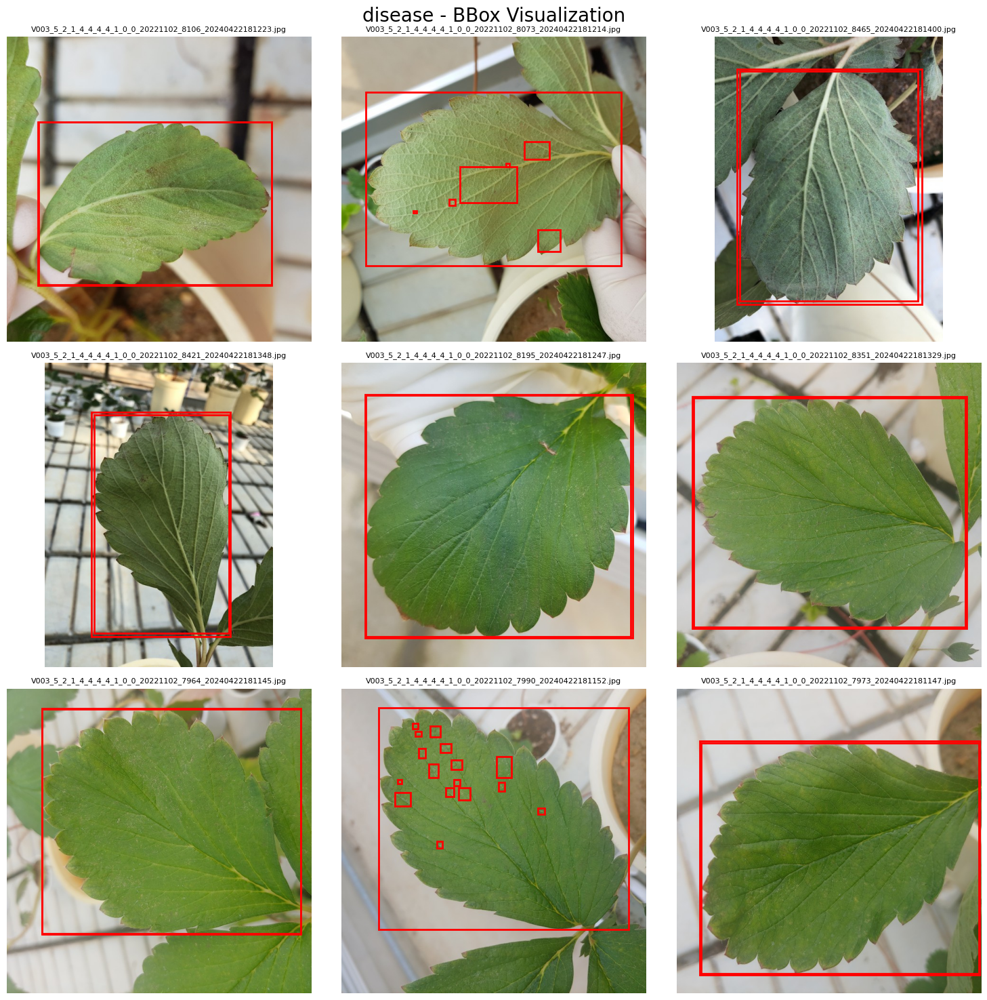

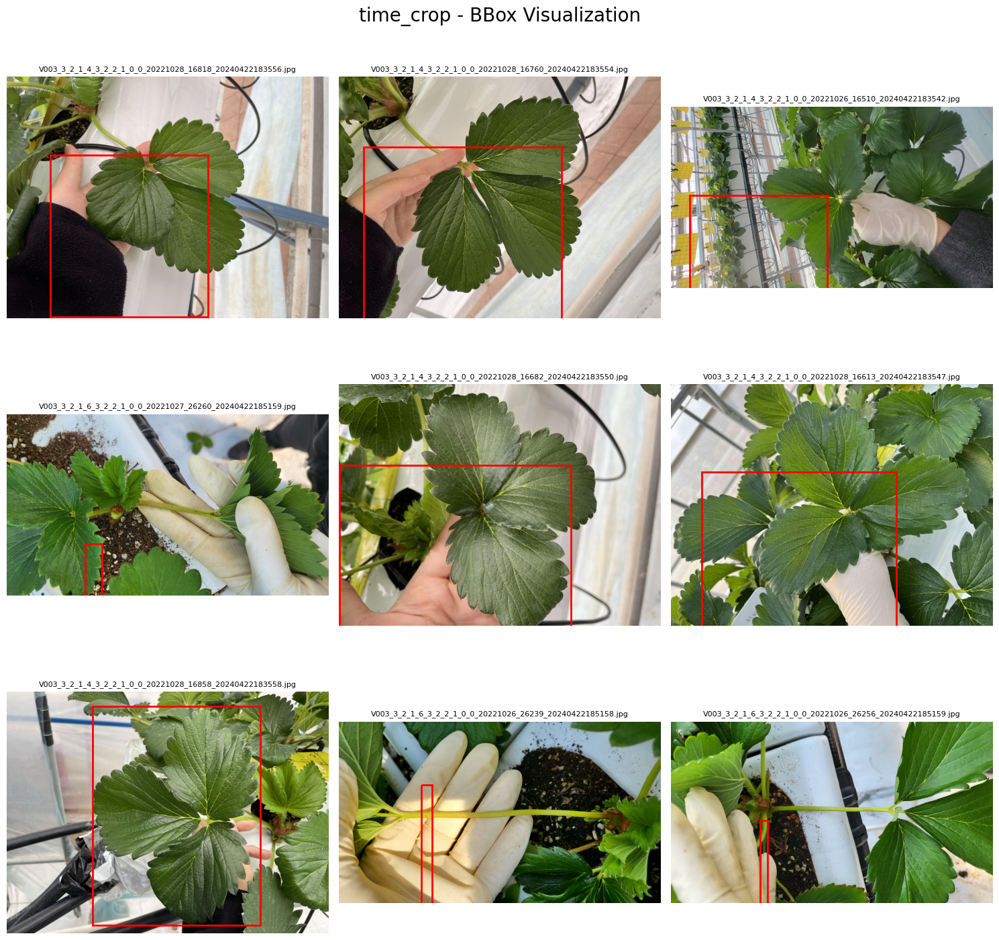

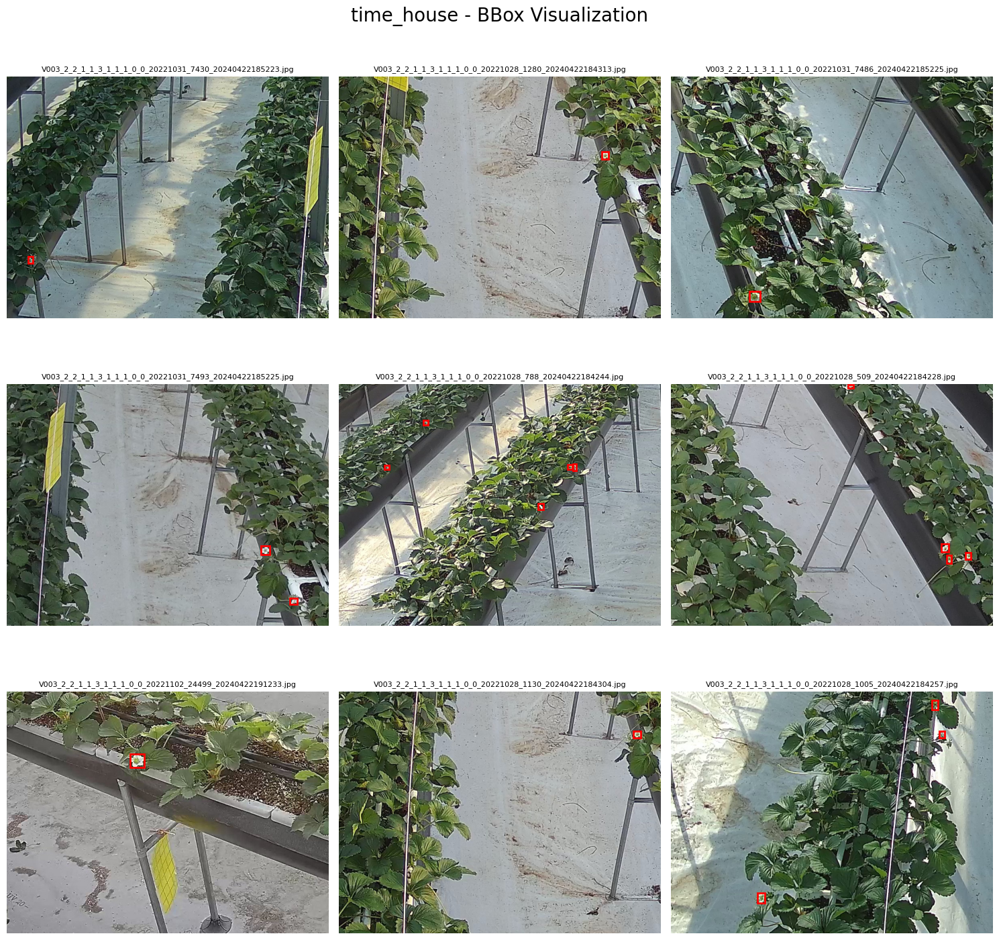

In [16]:
import os
import json
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

base_dir = '/Users/temp/Downloads/strawberry/split_dataset/train'
categories = ['disease', 'time_crop', 'time_house']

for category in categories:
    label_root = os.path.join(base_dir, 'label', category)
    image_root = os.path.join(base_dir, 'image', category)
    # 날짜 폴더 전체 순회
    date_folders = sorted(os.listdir(label_root))
    # 모든 json 파일 경로 수집
    json_files = []
    for date_folder in date_folders:
        date_path = os.path.join(label_root, date_folder)
        files = [os.path.join(date_path, f) for f in os.listdir(date_path) if f.endswith('.json')]
        json_files.extend(files)
    # 9개 샘플 추출
    sample_jsons = random.sample(json_files, min(9, len(json_files)))
    # 시각화
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle(f'{category} - BBox Visualization', fontsize=20)
    for ax, json_path in zip(axes.flatten(), sample_jsons):
        with open(json_path, 'r') as f:
            ann = json.load(f)
        img_name = ann['image']
        # 날짜 폴더명 추출
        date_folder = os.path.basename(os.path.dirname(json_path))
        img_path = os.path.join(image_root, date_folder, img_name)
        if not os.path.exists(img_path):
            ax.set_title('Image not found')
            ax.axis('off')
            continue
        img = Image.open(img_path)
        ax.imshow(img)
        # Draw all bounding boxes
        for obj in ann.get('result', []):
            if obj.get('type') == 'bbox':
                x, y, w, h = obj['x'], obj['y'], obj['w'], obj['h']
                rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
                ax.add_patch(rect)
        ax.set_title(img_name, fontsize=8)
        ax.axis('off')
    # 빈 칸 처리
    for i in range(len(sample_jsons), 9):
        axes.flatten()[i].axis('off')
    plt.tight_layout()
    plt.show()


# Timeseries and image data in house of original Dataset

## Json 일자별 폴더로 분리

In [19]:
import os
import shutil
import json
from pathlib import Path

# 기준 경로
base_path = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/'
folders = ['label']

# 1. 라벨 파일 날짜별로 분류
for folder in folders:
    label_dir = os.path.join(base_path, folder)
    for file in os.listdir(label_dir):
        if file.endswith('.json'):
            json_path = os.path.join(label_dir, file)
            with open(json_path, 'r', encoding='utf-8') as f:
                data = json.load(f)
            date = data['description']['date']
            date_folder = os.path.join(label_dir, date)
            Path(date_folder).mkdir(parents=True, exist_ok=True)
            shutil.move(json_path, os.path.join(date_folder, file))

## 일자별 비박스 분포 시각화

In [ ]:
import os
from collections import defaultdict

target_folder = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label'
# target_folder = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/val/label'


folder_stats = defaultdict(lambda: {'jpg': 0, 'json': 0, 'other': 0})

for root, dirs, files in os.walk(target_folder):
    for file in files:
        ext = file.lower().split('.')[-1]
        if ext == 'jpg':
            folder_stats[root]['jpg'] += 1
        elif ext == 'json':
            folder_stats[root]['json'] += 1
        else:
            folder_stats[root]['other'] += 1

for folder, stats in folder_stats.items():
    print(f"\n폴더: {folder}")
    print(f"  JPG 파일 개수: {stats['jpg']}")
    print(f"  JSON 파일 개수: {stats['json']}")
    print(f"  기타 파일 개수: {stats['other']}")


폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221103
  JPG 파일 개수: 0
  JSON 파일 개수: 8155
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221104
  JPG 파일 개수: 0
  JSON 파일 개수: 1900
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221105
  JPG 파일 개수: 0
  JSON 파일 개수: 1264
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221102
  JPG 파일 개수: 0
  JSON 파일 개수: 6023
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221227
  JPG 파일 개수: 0
  JSON 파일 개수: 121
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221229
  JPG 파일 개수: 0
  JSON 파일 개수: 35
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221228
  JPG 파일 개수: 0
  JSON 파일 개수: 109
  기타 파일 개수: 0

폴더: /Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label/20221


=== TRAIN ===
20221026: 이미지 484, 라벨 484, 매칭 484, 이미지만 0, 라벨만 0
20221027: 이미지 8, 라벨 8, 매칭 8, 이미지만 0, 라벨만 0
20221028: 이미지 1036, 라벨 1036, 매칭 1036, 이미지만 0, 라벨만 0
20221029: 이미지 2221, 라벨 2221, 매칭 2221, 이미지만 0, 라벨만 0
20221030: 이미지 3079, 라벨 3079, 매칭 3079, 이미지만 0, 라벨만 0
20221031: 이미지 1328, 라벨 1328, 매칭 1328, 이미지만 0, 라벨만 0
20221101: 이미지 11248, 라벨 11248, 매칭 11248, 이미지만 0, 라벨만 0
20221102: 이미지 6023, 라벨 6023, 매칭 6023, 이미지만 0, 라벨만 0
20221103: 이미지 8155, 라벨 8155, 매칭 8155, 이미지만 0, 라벨만 0
20221104: 이미지 1900, 라벨 1900, 매칭 1900, 이미지만 0, 라벨만 0
20221105: 이미지 1264, 라벨 1264, 매칭 1264, 이미지만 0, 라벨만 0
20221106: 이미지 1411, 라벨 1411, 매칭 1411, 이미지만 0, 라벨만 0
20221225: 이미지 75, 라벨 75, 매칭 75, 이미지만 0, 라벨만 0
20221226: 이미지 154, 라벨 154, 매칭 154, 이미지만 0, 라벨만 0
20221227: 이미지 121, 라벨 121, 매칭 121, 이미지만 0, 라벨만 0
20221228: 이미지 109, 라벨 109, 매칭 109, 이미지만 0, 라벨만 0
20221229: 이미지 35, 라벨 35, 매칭 35, 이미지만 0, 라벨만 0
20221230: 이미지 36, 라벨 36, 매칭 36, 이미지만 0, 라벨만 0
20221231: 이미지 40, 라벨 40, 매칭 40, 이미지만 0, 라벨만 0


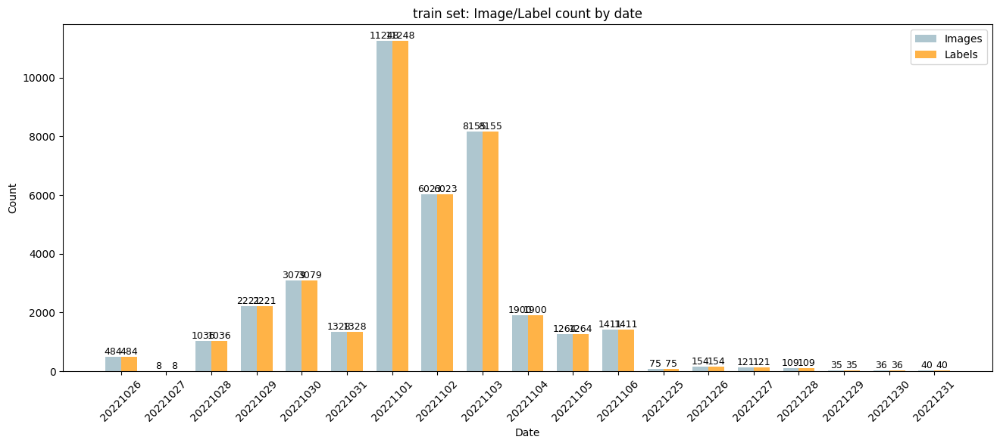


=== VAL ===
20221106: 이미지 6, 라벨 6, 매칭 6, 이미지만 0, 라벨만 0
20221110: 이미지 800, 라벨 800, 매칭 800, 이미지만 0, 라벨만 0
20221111: 이미지 750, 라벨 750, 매칭 750, 이미지만 0, 라벨만 0
20221112: 이미지 800, 라벨 800, 매칭 800, 이미지만 0, 라벨만 0
20221113: 이미지 700, 라벨 700, 매칭 700, 이미지만 0, 라벨만 0
20221114: 이미지 800, 라벨 800, 매칭 800, 이미지만 0, 라벨만 0
20221115: 이미지 801, 라벨 801, 매칭 801, 이미지만 0, 라벨만 0
20221116: 이미지 113, 라벨 113, 매칭 113, 이미지만 0, 라벨만 0
20221224: 이미지 16, 라벨 16, 매칭 16, 이미지만 0, 라벨만 0
20221225: 이미지 55, 라벨 55, 매칭 55, 이미지만 0, 라벨만 0


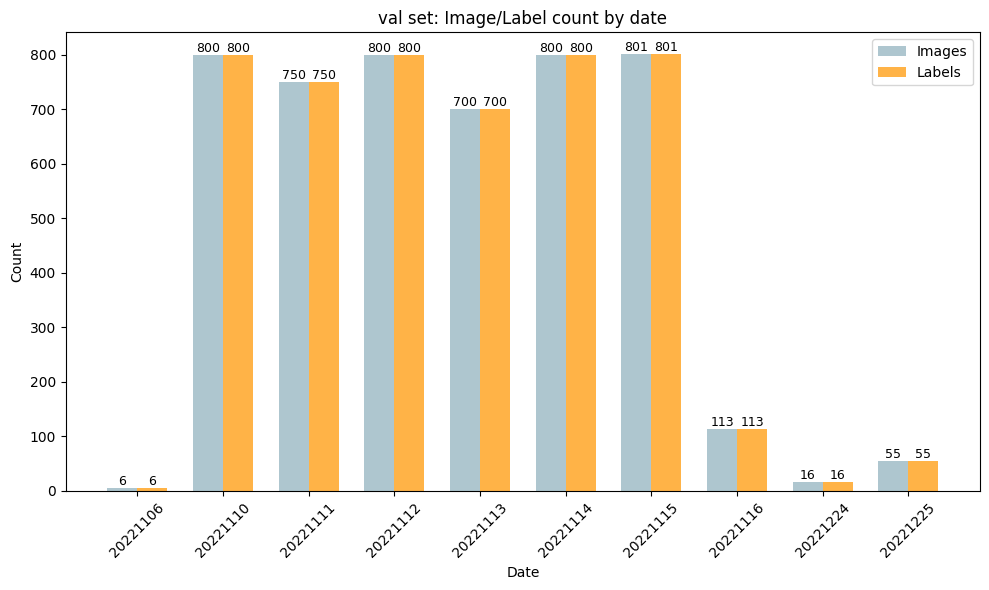

In [ ]:
import os
from collections import defaultdict
import matplotlib.pyplot as plt

base_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset'

def extract_date_from_filename(filename):
    # 예: V003_3_2_1_3_4_2_2_5_0_0_20221102_4481_20240422182112.jpg
    parts = filename.split('_')
    for part in parts:
        if len(part) == 8 and part.isdigit() and part.startswith('20'):
            return part
    return None

def check_image_label_matching(image_dir, label_dir):
    stats = defaultdict(lambda: {'image': 0, 'label': 0, 'matched': 0, 'unmatched_image': 0, 'unmatched_label': 0})
    # 라벨 날짜별 폴더
    date_folders = sorted([d for d in os.listdir(label_dir) if os.path.isdir(os.path.join(label_dir, d))])
    # 이미지 파일 전체 리스트
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    # 이미지 파일을 날짜별로 분류
    images_by_date = defaultdict(set)
    for img in image_files:
        date = extract_date_from_filename(img)
        if date:
            images_by_date[date].add(os.path.splitext(img)[0])
    for date in date_folders:
        label_path = os.path.join(label_dir, date)
        label_files = [os.path.splitext(f)[0] for f in os.listdir(label_path) if f.lower().endswith('.json')]
        label_set = set(label_files)
        image_set = images_by_date.get(date, set())
        matched = image_set & label_set
        stats[date]['image'] = len(image_set)
        stats[date]['label'] = len(label_set)
        stats[date]['matched'] = len(matched)
        stats[date]['unmatched_image'] = len(image_set - label_set)
        stats[date]['unmatched_label'] = len(label_set - image_set)
    return stats

def plot_date_counts(stats, split_name):
    import numpy as np
    pastel_colors = ['#AEC6CF', '#FFB347']  # 파스텔 블루, 파스텔 오렌지
    dates = sorted(stats.keys())
    img_counts = [stats[d]['image'] for d in dates]
    lbl_counts = [stats[d]['label'] for d in dates]
    x = np.arange(len(dates))
    width = 0.35
    plt.figure(figsize=(max(10, len(dates)*0.7), 6))
    bars1 = plt.bar(x - width/2, img_counts, width, color=pastel_colors[0], label='Images')
    bars2 = plt.bar(x + width/2, lbl_counts, width, color=pastel_colors[1], label='Labels')
    # 바 위에 카운트 표시
    for bar in bars1:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height, f'{int(height)}', ha='center', va='bottom', fontsize=9)
    for bar in bars2:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height, f'{int(height)}', ha='center', va='bottom', fontsize=9)
    plt.xticks(x, dates, rotation=45)
    plt.title(f'{split_name} set: Image/Label count by date')
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.legend()
    plt.tight_layout()
    plt.show()

for split in ['train', 'val']:
    print(f"\n=== {split.upper()} ===")
    image_dir = os.path.join(base_dir, split, 'image')
    label_dir = os.path.join(base_dir, split, 'label')
    stats = check_image_label_matching(image_dir, label_dir)
    for date, s in sorted(stats.items()):
        print(f"{date}: 이미지 {s['image']}, 라벨 {s['label']}, 매칭 {s['matched']}, 이미지만 {s['unmatched_image']}, 라벨만 {s['unmatched_label']}")
    plot_date_counts(stats, split)


## 통합 후 정한 기간에 맞게 학습 및 검증 재분리

In [25]:
import os
import shutil

# 기존 이미지/라벨 폴더 경로
train_img_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/image'
val_img_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/val/image'
train_label_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/label'
val_label_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/val/label'

# 통합 폴더 경로 (최상위 total 폴더)
total_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/total'
total_img_dir = os.path.join(total_dir, 'image')
total_label_dir = os.path.join(total_dir, 'label')

os.makedirs(total_img_dir, exist_ok=True)
os.makedirs(total_label_dir, exist_ok=True)

# 이미지 통합 (train/val 모두)
for src_dir in [train_img_dir, val_img_dir]:
    if os.path.isdir(src_dir):
        for fname in os.listdir(src_dir):
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                shutil.copy2(os.path.join(src_dir, fname), os.path.join(total_img_dir, fname))

# 라벨 통합 (train/val 모두, 하위 날짜폴더까지)
def copy_labels(label_root):
    if not os.path.isdir(label_root):
        return
    for date_folder in os.listdir(label_root):
        date_path = os.path.join(label_root, date_folder)
        if os.path.isdir(date_path):
            for fname in os.listdir(date_path):
                if fname.lower().endswith('.json'):
                    shutil.copy2(os.path.join(date_path, fname), os.path.join(total_label_dir, fname))
copy_labels(train_label_dir)
copy_labels(val_label_dir)

print('이미지/라벨 통합 완료')

# 이후 학습/검증 분리용 기준 날짜
train_dates = [
    '20221028','20221029','20221030','20221031','20221101','20221102','20221103','20221104','20221105','20221106'
]
val_dates = [
    '20221110','20221111','20221112','20221113','20221114','20221115','20221116',
    '20221224','20221225','20221226','20221227','20221228','20221229','20221230','20221231'
]

# 파일명에서 날짜 추출 함수
def extract_date_from_filename(filename):
    parts = filename.split('_')
    for part in parts:
        if len(part) == 8 and part.isdigit() and part.startswith('20'):
            return part
    return None

# 학습/검증용 폴더 생성
split_train_img = os.path.join(total_dir, 'split_train_image')
split_val_img = os.path.join(total_dir, 'split_val_image')
split_train_label = os.path.join(total_dir, 'split_train_label')
split_val_label = os.path.join(total_dir, 'split_val_label')
os.makedirs(split_train_img, exist_ok=True)
os.makedirs(split_val_img, exist_ok=True)
os.makedirs(split_train_label, exist_ok=True)
os.makedirs(split_val_label, exist_ok=True)

# 이미지 분리
for fname in os.listdir(total_img_dir):
    date = extract_date_from_filename(fname)
    src = os.path.join(total_img_dir, fname)
    if date in train_dates:
        shutil.copy2(src, os.path.join(split_train_img, fname))
    elif date in val_dates:
        shutil.copy2(src, os.path.join(split_val_img, fname))

# 라벨 분리
for fname in os.listdir(total_label_dir):
    date = extract_date_from_filename(fname)
    src = os.path.join(total_label_dir, fname)
    if date in train_dates:
        shutil.copy2(src, os.path.join(split_train_label, fname))
    elif date in val_dates:
        shutil.copy2(src, os.path.join(split_val_label, fname))

print('학습/검증 날짜 기준 분리 완료')


이미지/라벨 통합 완료
학습/검증 날짜 기준 분리 완료


## 일자별 파일 분포 시각화

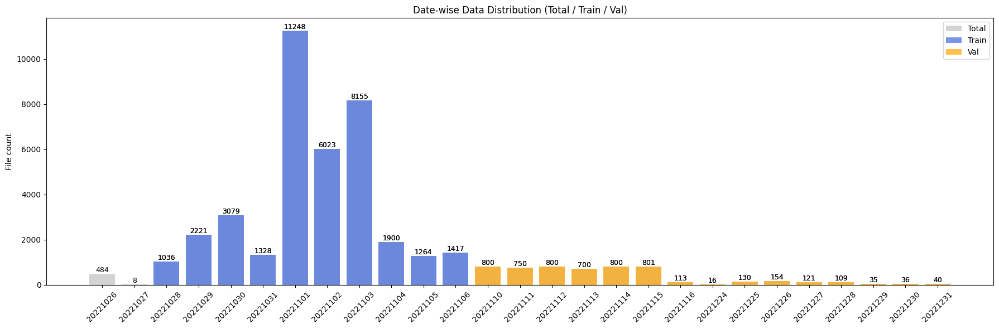

전체 파일 수: 43568
학습 총량: 37671
검증 총량: 5405
학습:검증 Ratio: 86.46 : 12.41


In [34]:
import os
import matplotlib.pyplot as plt

# 경로 설정
img_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/total/image'

# 날짜 리스트
train_dates = [
    '20221028','20221029','20221030','20221031','20221101','20221102','20221103','20221104','20221105','20221106'
]
val_dates = [
    '20221110','20221111','20221112','20221113','20221114','20221115','20221116',
    '20221224','20221225','20221226','20221227','20221228','20221229','20221230','20221231'
]

# 날짜별 개수 집계
img_counts = {}
for fname in os.listdir(img_dir):
    if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        parts = fname.split('_')
        date = None
        for part in parts:
            if len(part) == 8 and part.isdigit() and part.startswith('20'):
                date = part
                break
        if date:
            img_counts[date] = img_counts.get(date, 0) + 1

# 모든 날짜 정렬
all_dates = sorted(img_counts.keys())
total_counts = [img_counts.get(d, 0) for d in all_dates]
train_counts = [img_counts.get(d, 0) if d in train_dates else 0 for d in all_dates]
val_counts = [img_counts.get(d, 0) if d in val_dates else 0 for d in all_dates]

# 그래프 그리기
plt.figure(figsize=(18,6))
bar_total = plt.bar(all_dates, total_counts, color='lightgray', label='Total')
bar_train = plt.bar(all_dates, train_counts, color='royalblue', label='Train', alpha=0.7)
bar_val = plt.bar(all_dates, val_counts, color='orange', label='Val', alpha=0.7)
plt.xticks(rotation=45)
plt.ylabel('File count')
plt.title('Date-wise Data Distribution (Total / Train / Val)')
plt.legend()

# 각 바 위에 개수 표시
for bars in [bar_total, bar_train, bar_val]:
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            plt.text(bar.get_x() + bar.get_width()/2, height, f'{int(height)}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# 총 파일 수 계산
total_files = sum(total_counts)
train_files = sum(train_counts)
val_files = sum(val_counts)
print(f'전체 파일 수: {total_files}')
print(f'학습 총량: {train_files}')
print(f'검증 총량: {val_files}')
print(f'학습:검증 Ratio: {round((train_files/total_files)*100, 2)} : {round((val_files/total_files)*100, 2)}')


## 메타데이터 형태 정리

In [36]:
import os
import json

def flatten_metadata(metadata):
    """Convert metadata list of dicts to a flat dict."""
    meta_dict = {}
    for item in metadata:
        k = item.get("name", "")
        v = item.get("value", "")
        if k and v:
            meta_dict[k] = v
    return meta_dict

def convert_json_structure(json_path):
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    # Description
    desc = data.get('description', {})
    image = desc.get('image')
    height = desc.get('height')
    width = desc.get('width')
    date = desc.get('date')
    time = desc.get('time')
    # Combine date and time
    datetime_str = None
    if date and time:
        date_fmt = f"{date[:4]}-{date[4:6]}-{date[6:]}"
        if len(time) == 6:
            time_fmt = f"{time[:2]}:{time[2:4]}:{time[4:]}"
        elif len(time) == 4:
            time_fmt = f"{time[:2]}:{time[2:]}"
        else:
            time_fmt = time
        datetime_str = f"{date_fmt} {time_fmt}"
    # Metadata
    meta = flatten_metadata(data.get('metadata', []))
    # Result
    result = []
    for obj in data.get('result', []):
        if obj.get('type') == 'bbox':
            bbox = {
                "type": "bbox",
                "x": obj.get('x'),
                "y": obj.get('y'),
                "w": obj.get('w'),
                "h": obj.get('h')
            }
            if 'attrb' in obj:
                bbox["attrb"] = obj["attrb"]
            result.append(bbox)
    # Build new structure
    new_data = {
        "image": image,
        "height": height,
        "width": width,
        "datetime": datetime_str,
        **meta,
        "result": result
    }
    # Remove None values
    new_data = {k: v for k, v in new_data.items() if v is not None}
    # Overwrite file
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(new_data, f, ensure_ascii=False, indent=2)

root_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/split_train_label'
for dirpath, _, filenames in os.walk(root_dir):
    for fname in filenames:
        if fname.endswith('.json'):
            convert_json_structure(os.path.join(dirpath, fname))

## 메타데이터 영어로 매핑

In [38]:
import os
import json

# 한글→영어 매핑
metadata_map = {
    "데이터종류코드": "data_type",
    "작물코드": "crop_code",
    "개체코드": "object_code",
    "작물부위코드": "crop_part_code",
    "생육단계코드": "growth_stage_code",
    "생육지표코드": "growth_index_code",
    "작물종류코드": "crop_type_code",
    "작물상태코드": "crop_status_code",
    "피해정도코드": "damage_level_code"
}
value_map = {
    "구분없음": "unknown",
    "생육측정": "growth_measure",
    "딸기_설향": "strawberry_seolhyang",
    "엽병장": "petiole_length",
    "잿빛곰팡이병": "gray_mold",
    "병충해피해": "pest_disease_damage",
    "열매": "fruit",
    "착화/과실기": "flowering_fruiting_stage",
    "중기 이후": "post_mid_stage",
    "정상": "normal",
    "시계열생육(자동)": "timeseries_growth_auto",
    "생장기": "growth_period",
    "흰가루병": "powdery_mildew"
}
attrb_map = {
    "꽃": "flower",
    "병징": "symptom",
    "객체": "object"
}

def translate_to_english(json_path):
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    new_data = {}
    for k, v in data.items():
        # key: 한글이면 영어로, 아니면 그대로
        eng_key = metadata_map.get(k, k)
        # value: 한글이면 영어로, 아니면 그대로
        if isinstance(v, str):
            eng_value = value_map.get(v, v)
        elif isinstance(v, list):
            # result 리스트 등 처리
            if eng_key == 'result':
                new_result = []
                for obj in v:
                    new_obj = {}
                    for ok, ov in obj.items():
                        if ok == 'attrb':
                            new_obj[ok] = attrb_map.get(ov, ov)
                        else:
                            new_obj[ok] = value_map.get(ov, ov) if isinstance(ov, str) else ov
                    new_result.append(new_obj)
                eng_value = new_result
            else:
                eng_value = [
                    value_map.get(item, item) if isinstance(item, str) else item
                    for item in v
                ]
        else:
            eng_value = v
        new_data[eng_key] = eng_value
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(new_data, f, ensure_ascii=False, indent=2)

root_dir = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/val/split_val_label'
for dirpath, _, filenames in os.walk(root_dir):
    for fname in filenames:
        if fname.endswith('.json'):
            translate_to_english(os.path.join(dirpath, fname))


## 비박스 시각화

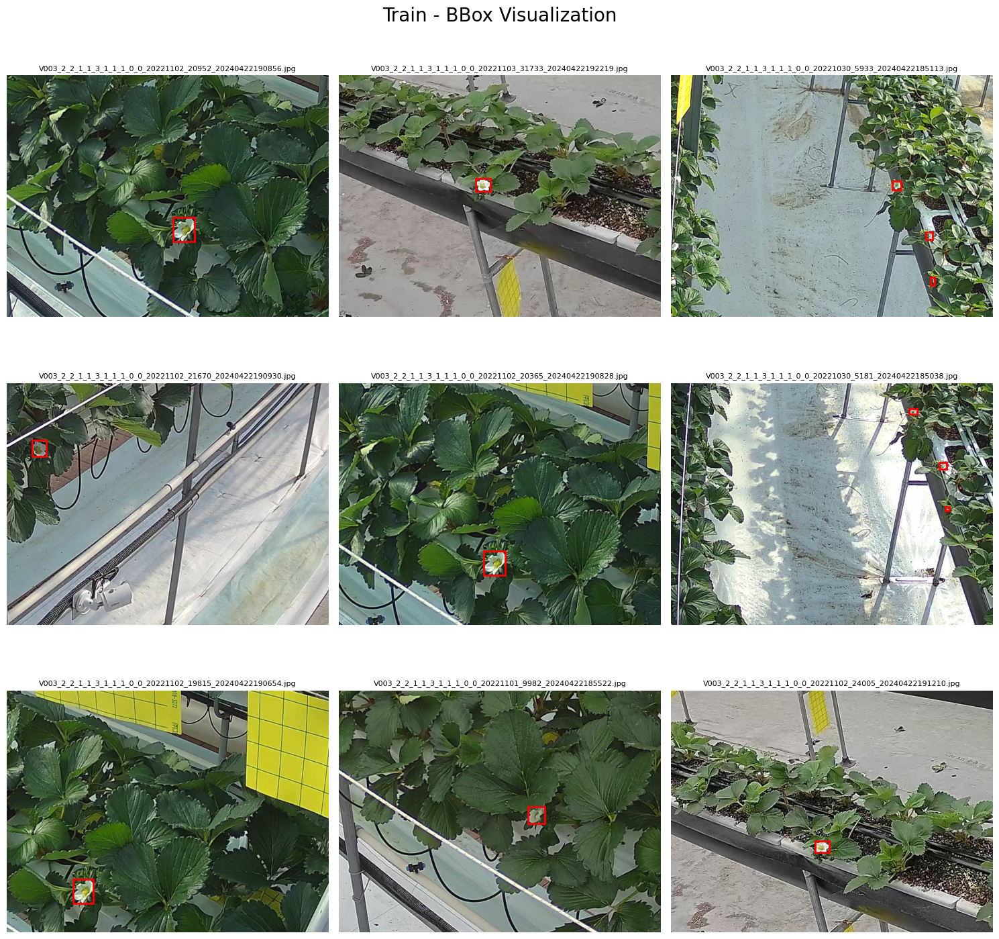

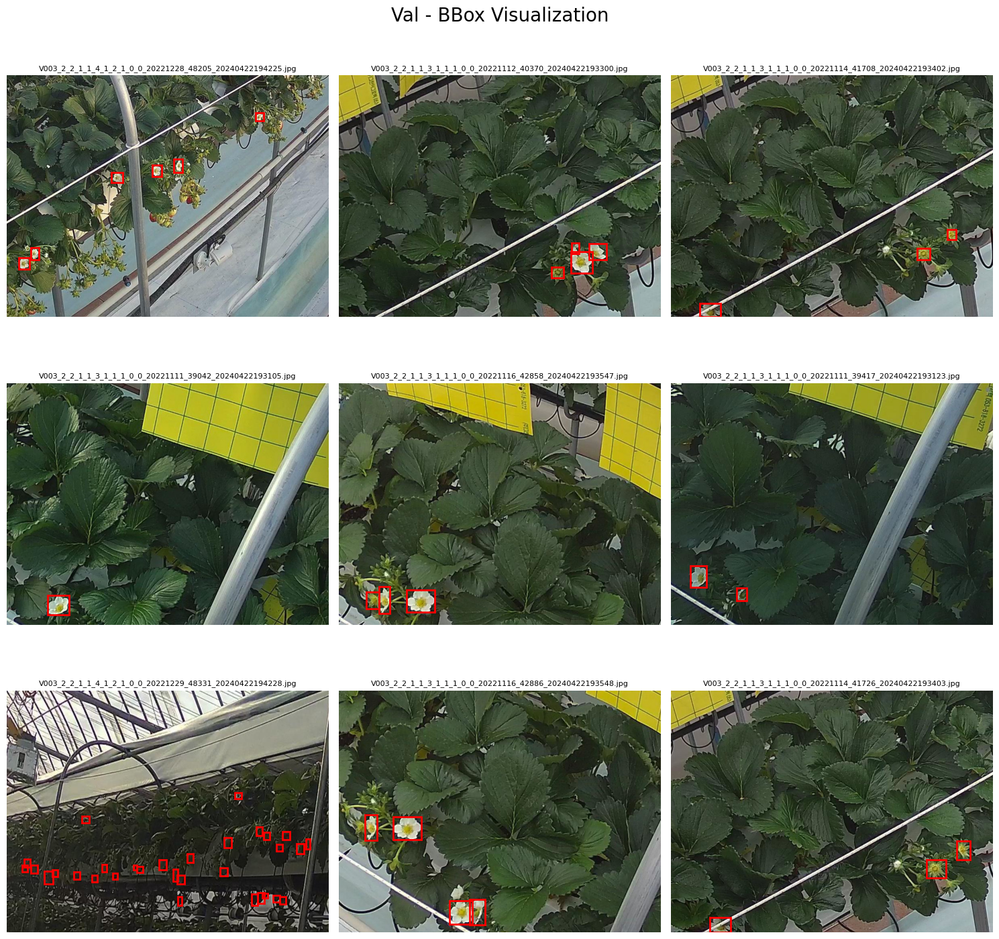

In [39]:
import os
import json
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_bbox_samples(label_root, image_root, n=9, title_prefix=''):
    # 모든 json 파일 경로 수집 (하위 폴더 없이 flat 구조라면 바로 사용)
    json_files = [os.path.join(label_root, f) for f in os.listdir(label_root) if f.endswith('.json')]
    # 9개 샘플 추출
    sample_jsons = random.sample(json_files, min(n, len(json_files)))
    # 시각화
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle(f'{title_prefix} - BBox Visualization', fontsize=20)
    for ax, json_path in zip(axes.flatten(), sample_jsons):
        with open(json_path, 'r') as f:
            ann = json.load(f)
        img_name = ann['image']
        img_path = os.path.join(image_root, img_name)
        if not os.path.exists(img_path):
            ax.set_title('Image not found')
            ax.axis('off')
            continue
        img = Image.open(img_path)
        ax.imshow(img)
        # Draw all bounding boxes
        for obj in ann.get('result', []):
            if obj.get('type') == 'bbox':
                x, y, w, h = obj['x'], obj['y'], obj['w'], obj['h']
                rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
                ax.add_patch(rect)
        ax.set_title(img_name, fontsize=8)
        ax.axis('off')
    # 빈 칸 처리
    for i in range(len(sample_jsons), 9):
        axes.flatten()[i].axis('off')
    plt.tight_layout()
    plt.show()

# 경로 지정 (flat 구조)
train_label_root = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/split_train_label'
train_image_root = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/train/split_train_image'
val_label_root = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/val/split_val_label'
val_image_root = '/Users/temp/Downloads/strawberry/timeseries_house_dataset/val/split_val_image'

# 학습 데이터 시각화
visualize_bbox_samples(train_label_root, train_image_root, n=9, title_prefix='Train')

# 검증 데이터 시각화
visualize_bbox_samples(val_label_root, val_image_root, n=9, title_prefix='Val')
